# Hourly Energy Consumption Forecast 

PJM Hourly Energy Consumption Data
PJM Interconnection LLC (PJM) is a regional transmission organization (RTO) in the United States. It is part of the Eastern Interconnection grid operating an electric transmission system serving all or parts of Delaware, Illinois, Indiana, Kentucky, Maryland, Michigan, New Jersey, North Carolina, Ohio, Pennsylvania, Tennessee, Virginia, West Virginia, and the District of Columbia. The hourly power consumption data comes from PJM's website and are in megawatts (MW). The regions have changed over the years so data may only appear for certain dates per region.


#### Import the libraries

In [7]:
!pip install prophet

Defaulting to user installation because normal site-packages is not writeable


In [8]:
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np # linear algebra
import warnings
import itertools
import statsmodels.api as sm
import datetime

# Plotly is a graphing library for interactive, publication-quality graphs
# pip install plotly==4.5.4
import plotly.graph_objects as go                   
import plotly.express as px
from plotly.subplots import make_subplots

from pandas import DataFrame
from numpy import sqrt
import statsmodels.formula.api as smf
from numpy import log
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error
color_pal = sns.color_palette()
plt.style.use('fivethirtyeight')

from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.graphics.tsaplots as tsa_plots
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error
import tensorflow as tf
from prophet import Prophet
from xgboost import XGBRegressor

## 1. Data Collection and Description

In [10]:
df= pd.read_excel(r"D:\DS PROJECT 4 FORECASTING\Dataset Files\PJMW_MW_Hourly.xlsx")
df.head()

,Datetime,PJMW_MW
0,2002-12-31 01:00:00,5077
1,2002-12-31 02:00:00,4939
2,2002-12-31 03:00:00,4885
3,2002-12-31 04:00:00,4857
4,2002-12-31 05:00:00,4930


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 143206 entries, 0 to 143205
Data columns (total 2 columns):
 #   Column    Non-Null Count   Dtype         
---  ------    --------------   -----         
 0   Datetime  143206 non-null  datetime64[ns]
 1   PJMW_MW   143206 non-null  int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 2.2 MB


In [12]:
df.describe()

,Datetime,PJMW_MW
count,143206,143206.000000
mean,2010-06-02 03:39:50.656816128,5602.375089
min,2002-04-01 01:00:00,487.000000
25%,2006-05-02 03:15:00,4907.000000
50%,2010-06-02 04:30:00,5530.000000
75%,2014-07-03 06:45:00,6252.000000
max,2018-08-03 00:00:00,9594.000000
std,NaN,979.142872


## NULL Values

In [14]:
df.isnull().sum()

Datetime    0
PJMW_MW     0
dtype: int64

<Axes: >

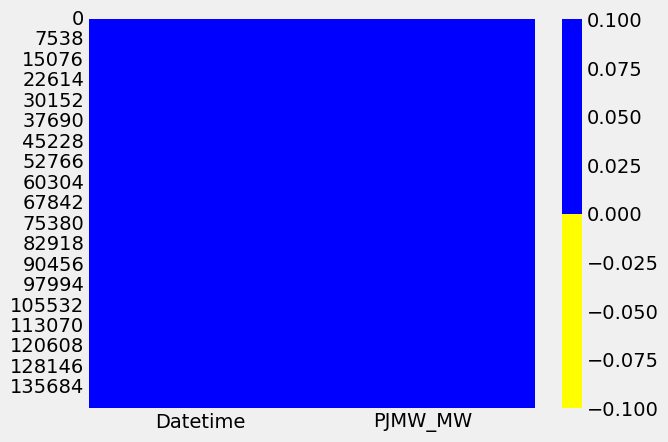

In [15]:
col = df.columns
colours=['yellow','blue']
sns.heatmap(df.isnull(),cmap=sns.color_palette(colours))

In [16]:
df.duplicated().sum()

0

### There are no null values and duplicated values present in the data

# Plotting the whole data
## Line Plot

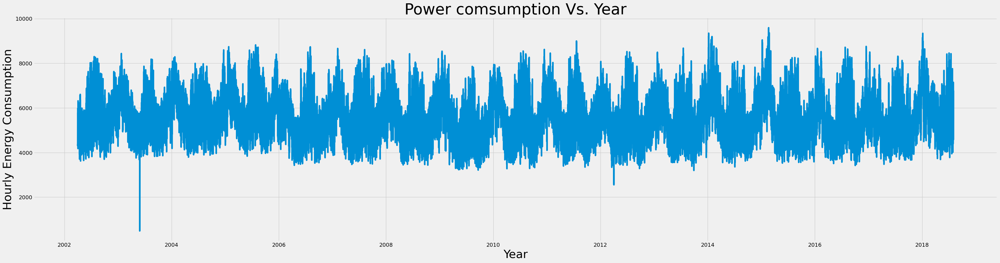

In [19]:
#Line plot
plt.figure(figsize=(40,10))
sns.lineplot(y='PJMW_MW',x='Datetime',data=df);
plt.title('Power comsumption Vs. Year',fontsize=40);
plt.xlabel('Year',fontsize=30);
plt.ylabel('Hourly Energy Consumption',fontsize=30);

## Histogram

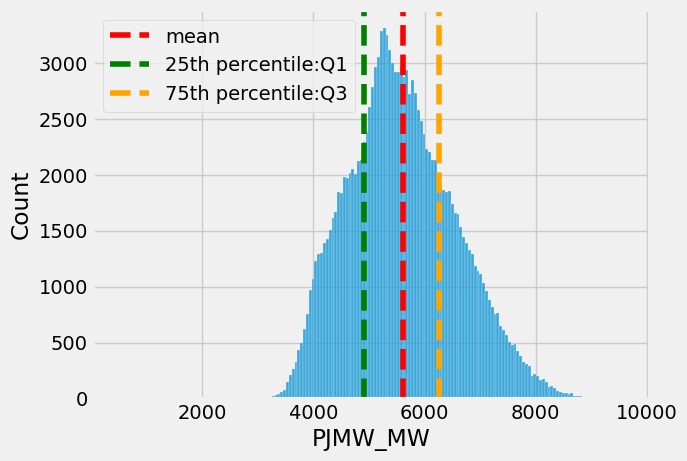

In [21]:
sns.histplot(df['PJMW_MW'])
plt.axvline(x=np.mean(df['PJMW_MW']), c='red', ls='--', label='mean')
plt.axvline(x=np.percentile(df['PJMW_MW'],25),c='green', ls='--', label = '25th percentile:Q1')
plt.axvline(x=np.percentile(df['PJMW_MW'],75),c='orange', ls='--',label = '75th percentile:Q3' )
plt.legend()

Though there is variation in the data i.e, there is peak point as well as low points, there is no any specific trend. It looks like a stationary series with constatnt mean and sd.

## Density Plot

<Axes: ylabel='Density'>

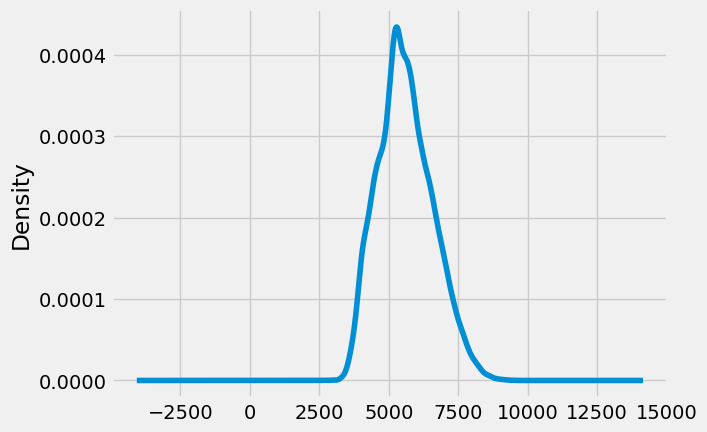

In [24]:
# Create a kernel density plot
df.PJMW_MW.plot(kind='kde')

## We are using first row of the data as the column headers and the first column as the DataFrame index

In [26]:
df = pd.read_excel("D:\DS PROJECT 4 FORECASTING\Dataset Files\PJMW_MW_Hourly.xlsx", header=0, index_col=0, parse_dates=True)
df.head()

<>:1: SyntaxWarning: invalid escape sequence '\D'
<>:1: SyntaxWarning: invalid escape sequence '\D'
C:\Users\anura\AppData\Local\Temp\ipykernel_14780\4034570256.py:1: SyntaxWarning: invalid escape sequence '\D'
  df = pd.read_excel("D:\DS PROJECT 4 FORECASTING\Dataset Files\PJMW_MW_Hourly.xlsx", header=0, index_col=0, parse_dates=True)


,PJMW_MW
Datetime,
2002-12-31 01:00:00,5077
2002-12-31 02:00:00,4939
2002-12-31 03:00:00,4885
2002-12-31 04:00:00,4857
2002-12-31 05:00:00,4930


In [27]:
df.shape

(143206, 1)

## Lag Plot

A lag plot is used to help evaluate whether the values in a dataset or time series are random. If the data are random, the lag plot will exhibit no identifiable pattern. If the data are not random, the lag plot will demonstrate a clearly identifiable pattern


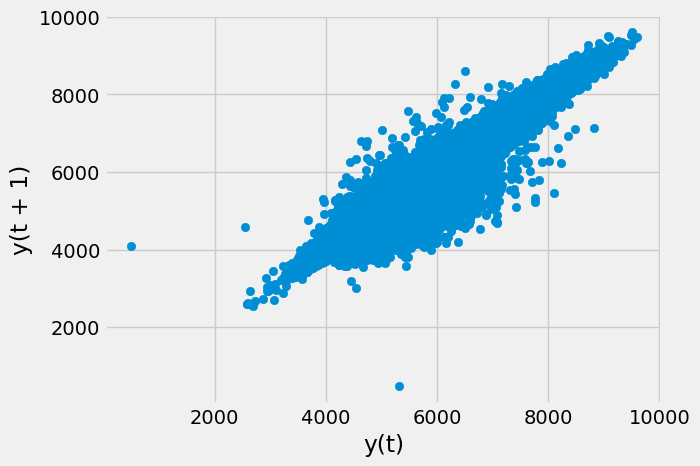

In [29]:
# Create a scatter plot 
from pandas.plotting import lag_plot

lag_plot(df)
plt.show()


Our data has Moderate Autocorrelation as the lag plot is in eliptical shape.

In [31]:
df.describe()

,PJMW_MW
count,143206.000000
mean,5602.375089
std,979.142872
min,487.000000
25%,4907.000000
50%,5530.000000
75%,6252.000000
max,9594.000000


## Outlier Analysis and Removal

<Axes: title={'center': 'Possibility of having Outliers'}, xlabel='Datetime'>

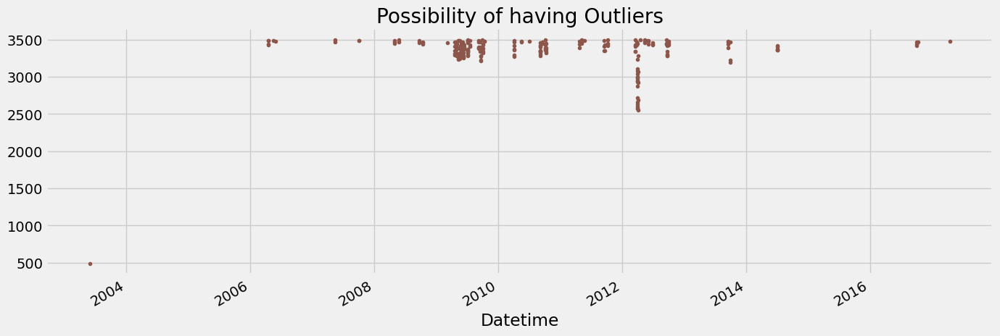

In [33]:
df.query('PJMW_MW <3500')['PJMW_MW'] \
    .plot(style= '.',
        figsize= (15,5),
        color= color_pal[5],
        title= 'Possibility of having Outliers')

<Axes: title={'center': 'Outliers which is present below lower_limit(PJMW_MW- 2889.5)'}, xlabel='Datetime'>

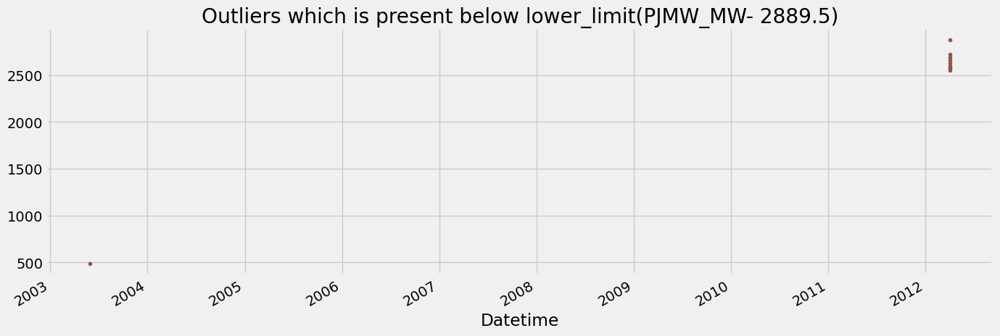

In [34]:
df.query('PJMW_MW <2889.5')['PJMW_MW'] \
    .plot(style= '.',
        figsize= (15,5),
        color= color_pal[5],
        title= 'Outliers which is present below lower_limit(PJMW_MW- 2889.5)')

<Axes: title={'center': 'Outliers which is present above upper_limit(PJMW_MW- 8269.5)'}, xlabel='Datetime'>

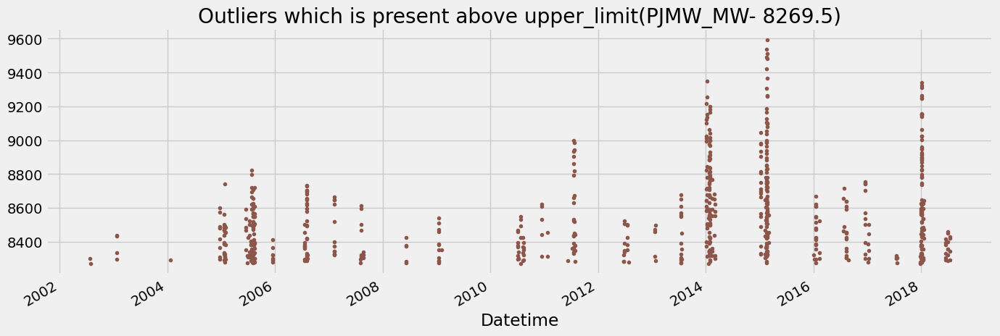

In [35]:
df.query('PJMW_MW >8269.5')['PJMW_MW'] \
    .plot(style= '.',
        figsize= (15,5),
        color= color_pal[5],
        title= 'Outliers which is present above upper_limit(PJMW_MW- 8269.5)')

In [36]:
Q1= df.PJMW_MW.quantile(0.25)
Q3= df.PJMW_MW.quantile(0.75)
Q1, Q3

(4907.0, 6252.0)

In [37]:
IQR= Q3- Q1
IQR

1345.0

In [38]:
lower_limit= Q1 - 1.5*IQR
upper_limit= Q3 + 1.5*IQR
lower_limit, upper_limit

(2889.5, 8269.5)

In [39]:
df[(df.PJMW_MW< lower_limit)|(df.PJMW_MW> upper_limit)]
df.head()

,PJMW_MW
Datetime,
2002-12-31 01:00:00,5077
2002-12-31 02:00:00,4939
2002-12-31 03:00:00,4885
2002-12-31 04:00:00,4857
2002-12-31 05:00:00,4930


In [40]:
df= df[(df.PJMW_MW> lower_limit)&(df.PJMW_MW< upper_limit)]
df.tail()

,PJMW_MW
Datetime,
2018-01-01 17:00:00,7747
2018-01-01 18:00:00,8213
2018-01-01 22:00:00,8238
2018-01-01 23:00:00,7958
2018-01-02 00:00:00,7691


In [41]:
df.shape

(142503, 1)

In [42]:
df.dtypes

PJMW_MW    int64
dtype: object

In [43]:
df.describe()

,PJMW_MW
count,142503.000000
mean,5588.247384
std,959.088761
min,2922.000000
25%,4902.000000
50%,5524.000000
75%,6239.000000
max,8269.000000


We have the hourly energy consumption data with 142503 rows from 2002 to 2018, after removing the outliers. 

In [45]:
df = df.sort_index()

Sorted the dataset to arrange it in ascending order

After sorting we found out that the data is from April 2002 to August 2018

C:\Users\anura\AppData\Local\Temp\ipykernel_14780\2092936780.py:1: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df.PJMW_MW.resample(rule='A').mean().plot()


<Axes: xlabel='Datetime'>

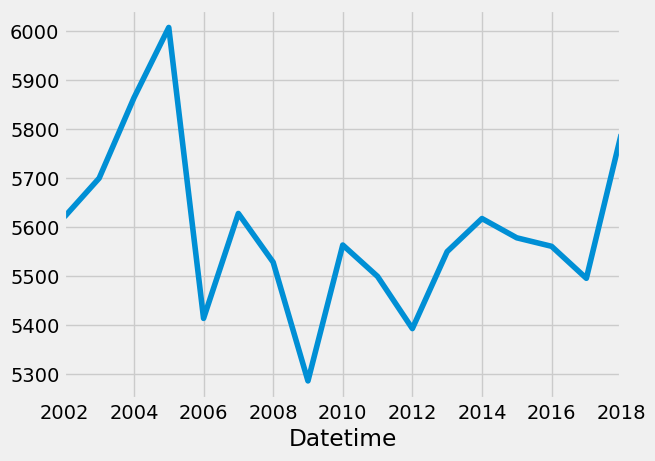

In [48]:
df.PJMW_MW.resample(rule='A').mean().plot()

C:\Users\anura\AppData\Local\Temp\ipykernel_14780\1321842475.py:1: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df.PJMW_MW.resample(rule='A').max().plot()


<Axes: xlabel='Datetime'>

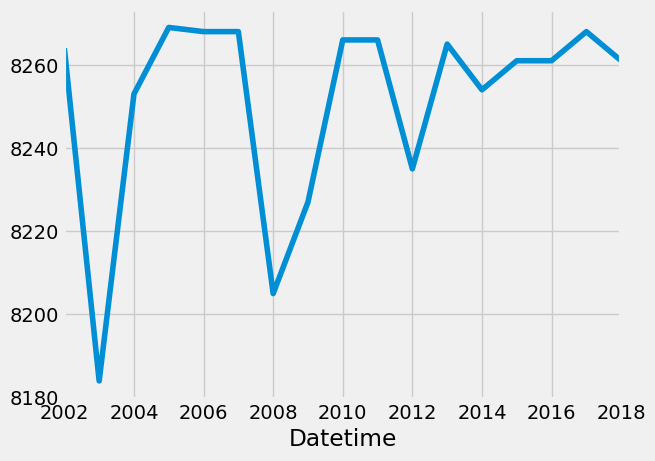

In [49]:
df.PJMW_MW.resample(rule='A').max().plot()

C:\Users\anura\AppData\Local\Temp\ipykernel_14780\2259194647.py:1: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df.PJMW_MW.resample(rule='A').min().plot()


<Axes: xlabel='Datetime'>

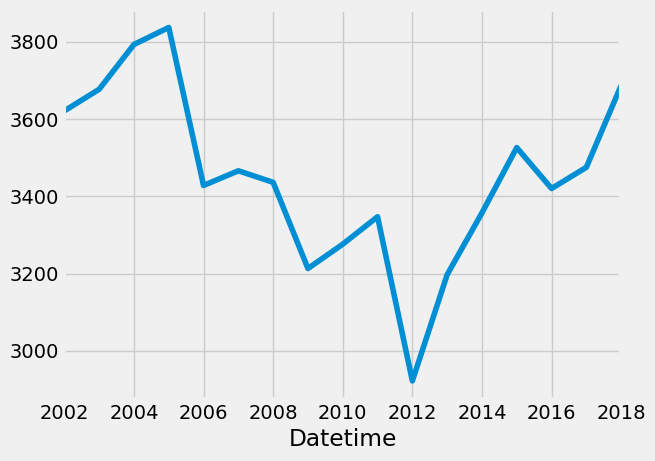

In [50]:
df.PJMW_MW.resample(rule='A').min().plot()

In [51]:
df.to_csv('dataset.csv')

In [52]:
type(df)

pandas.core.frame.DataFrame

In [53]:
cf= df.copy()

In [54]:
df1=df.copy()

In [55]:
df1.head()

,PJMW_MW
Datetime,
2002-04-01 01:00:00,4374
2002-04-01 02:00:00,4306
2002-04-01 03:00:00,4322
2002-04-01 04:00:00,4359
2002-04-01 05:00:00,4436


#### Extract the date, month, year, hour and weekname columns for further visualization

In [57]:
df1["Date"] = pd.to_datetime(df1.index,format='%Y-%m-%d %H:%M')

# Extracting Day, month name, year from the Datetime column using Date functions from pandas 

df1["month"] = df1.Date.dt.strftime("%b") # month extraction
df1["year"] = df1.Date.dt.strftime("%Y") # year extraction
df1["day"] = df1.Date.dt.strftime("%d") # day extraction
df1["Hour"] = df1.Date.dt.strftime("%H") # Hour extraction
df1['quarter'] = df1.index.quarter

In [58]:
df1 = df1.sort_index()

In [59]:
df1.drop('Date',axis=1,inplace=True)

In [60]:
# df1 = df1.reset_index()

# df1['weekday'] = df1['Datetime'].dt.dayofweek

# df1['weekday'] = pd.to_datetime(df1.index).day_of_week
df1['weekday_name'] = pd.to_datetime(df1.index).day_name()


In [61]:
df1.head()

,PJMW_MW,month,year,day,Hour,quarter,weekday_name
Datetime,,,,,,,
2002-04-01 01:00:00,4374,Apr,2002,01,01,2,Monday
2002-04-01 02:00:00,4306,Apr,2002,01,02,2,Monday
2002-04-01 03:00:00,4322,Apr,2002,01,03,2,Monday
2002-04-01 04:00:00,4359,Apr,2002,01,04,2,Monday
2002-04-01 05:00:00,4436,Apr,2002,01,05,2,Monday


## Heatmap

<Axes: xlabel='month', ylabel='year'>

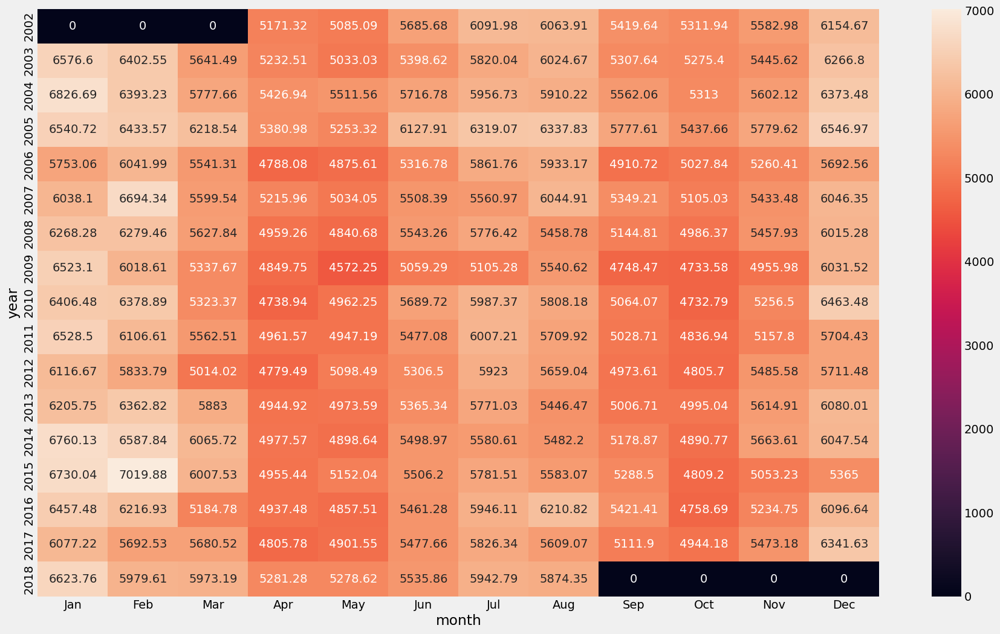

In [63]:
# Define the custom order of months
month_order = ['Jan','Feb','Mar','Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Create a pivot table with the custom order of months
heatmap_y_month = pd.pivot_table(data=df1, values='PJMW_MW', index='year', columns='month', aggfunc='mean', fill_value=0)
heatmap_y_month = heatmap_y_month.reindex(month_order, axis=1)
plt.figure(figsize= (20,12))
sns.heatmap(heatmap_y_month, annot= True, fmt= 'g') # fmt is format of the grid values

<Axes: xlabel='year', ylabel='PJMW_MW'>

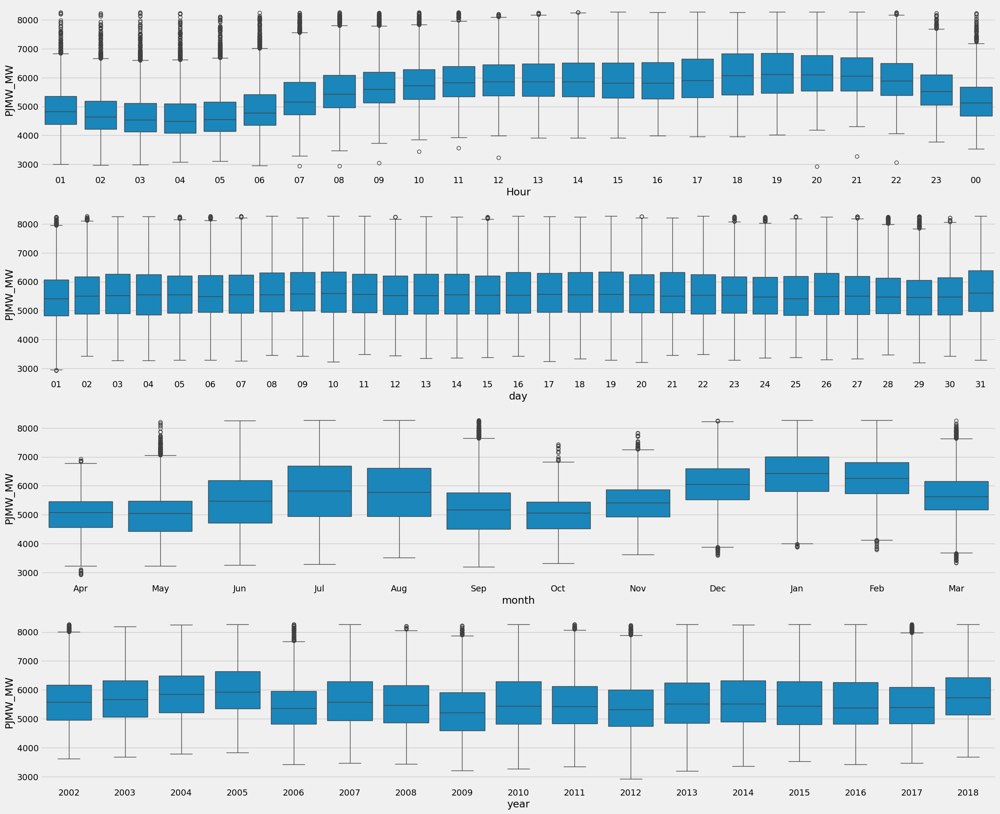

In [64]:
# Boxplot
plt.figure(figsize= (25,22))

plt.subplot(411)
sns.boxplot(x= 'Hour', y='PJMW_MW', data= df1)
plt.subplot(412)
sns.boxplot(x='day', y= 'PJMW_MW', data= df1)
plt.subplot(413)
sns.boxplot(x= 'month', y='PJMW_MW', data= df1)
plt.subplot(414)
sns.boxplot(x='year', y= 'PJMW_MW', data= df1)

In [65]:
df1.head()

,PJMW_MW,month,year,day,Hour,quarter,weekday_name
Datetime,,,,,,,
2002-04-01 01:00:00,4374,Apr,2002,01,01,2,Monday
2002-04-01 02:00:00,4306,Apr,2002,01,02,2,Monday
2002-04-01 03:00:00,4322,Apr,2002,01,03,2,Monday
2002-04-01 04:00:00,4359,Apr,2002,01,04,2,Monday
2002-04-01 05:00:00,4436,Apr,2002,01,05,2,Monday


## Pie Plot

Text(0.5, 1.0, 'hour')

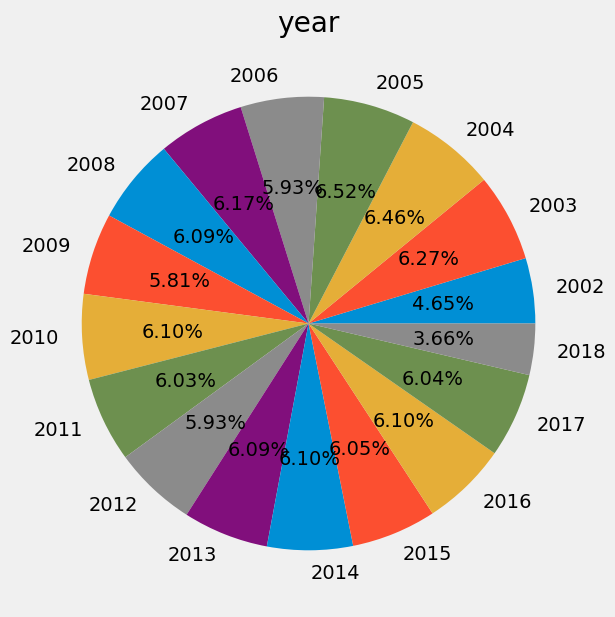

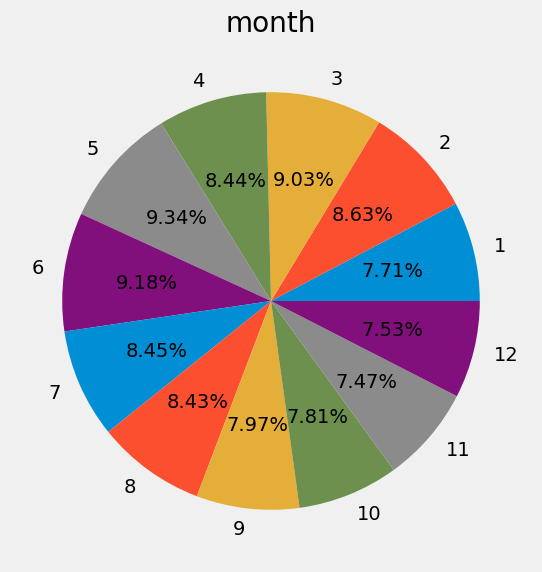

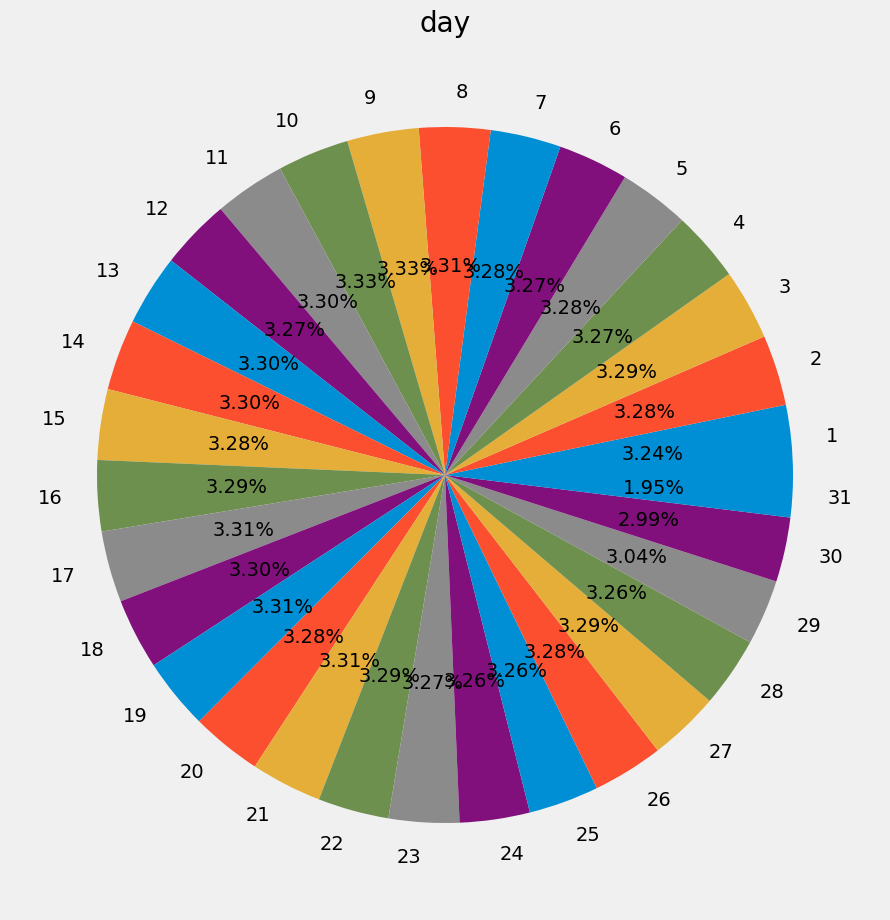

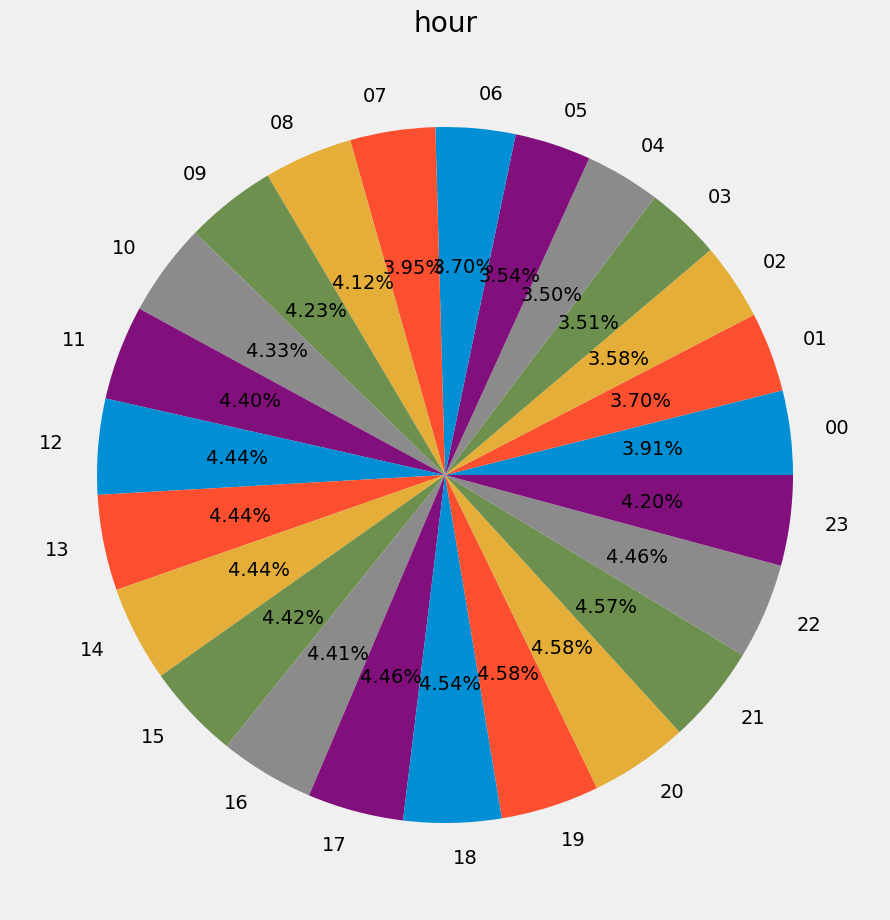

In [67]:
#pie plot
b=df1.groupby('year')[['PJMW_MW']].sum()
b=np.array(b['PJMW_MW'])
l=['2002','2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018']
plt.figure(figsize=(10,7))
plt.pie(b,labels=l,autopct='%1.2f%%')
plt.title('year')

c=df1.groupby('month')[['PJMW_MW']].sum()
c=np.array(c['PJMW_MW'])
l=['1','2','3','4','5','6','7','8','9','10','11','12']
plt.figure(figsize=(6,7))
plt.pie(c,labels=l,autopct='%1.2f%%')
plt.title('month')

d=df1.groupby('day')[['PJMW_MW']].sum()
d=np.array(d['PJMW_MW'])
l=['1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18','19','20','21','22','23','24','25','26','27','28','29','30','31']
plt.figure(figsize=(10,15))
plt.pie(d,labels=l,autopct='%1.2f%%')
plt.title('day')

e=df1.groupby('Hour')[['PJMW_MW']].sum()
e=np.array(e['PJMW_MW'])
l=['00','01','02','03','04','05','06','07','08','09','10','11','12','13','14','15','16','17','18','19','20','21','22','23']
plt.figure(figsize=(10,15))
plt.pie(e,labels=l,autopct='%1.2f%%')
plt.title('hour')

## Line Plot

In [69]:
df1.head()

,PJMW_MW,month,year,day,Hour,quarter,weekday_name
Datetime,,,,,,,
2002-04-01 01:00:00,4374,Apr,2002,01,01,2,Monday
2002-04-01 02:00:00,4306,Apr,2002,01,02,2,Monday
2002-04-01 03:00:00,4322,Apr,2002,01,03,2,Monday
2002-04-01 04:00:00,4359,Apr,2002,01,04,2,Monday
2002-04-01 05:00:00,4436,Apr,2002,01,05,2,Monday


In [70]:
# Creating times grouped dataframes in order to analyse them
df1_year = df1.groupby('year')['PJMW_MW'].sum()
df1_month = df1.groupby('month', sort = False)['PJMW_MW'].sum()
df1_quarter = df1.groupby('quarter')['PJMW_MW'].sum()
df1_weekday_name = df1.groupby('weekday_name', sort = False)['PJMW_MW'].sum()
df1_day = df1.groupby('day')['PJMW_MW'].sum()
df1_Hour = df1.groupby('Hour')['PJMW_MW'].sum()

In [71]:
# Creating a plotly subplot
fig = make_subplots(rows=3, cols=2, vertical_spacing = 0.175,
                    subplot_titles=(['Year', 'Month', 'Day of Month','Hour', 'Quarter']))

fig.add_trace(go.Scatter(x=df1_year.index, y = df1_year), row=1, col=1)
fig.add_trace(go.Scatter(x=df1_month.index, y=df1_month), row=1, col=2)
fig.add_trace(go.Scatter(x=df1_day.index, y=df1_day), row=2, col=2)
fig.add_trace(go.Scatter(x=df1_Hour.index, y=df1_Hour), row=2, col=1)
fig.add_trace(go.Scatter(x=df1_quarter.index, y=df1_quarter), row=3, col=1)

fig.update_layout(title = 'Energy Consumption of PJMW per', height = 700, showlegend = False)

fig.show()

<Axes: xlabel='quarter', ylabel='PJMW_MW'>

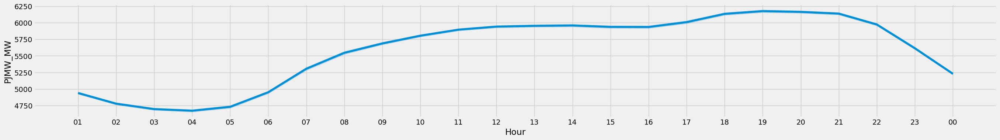

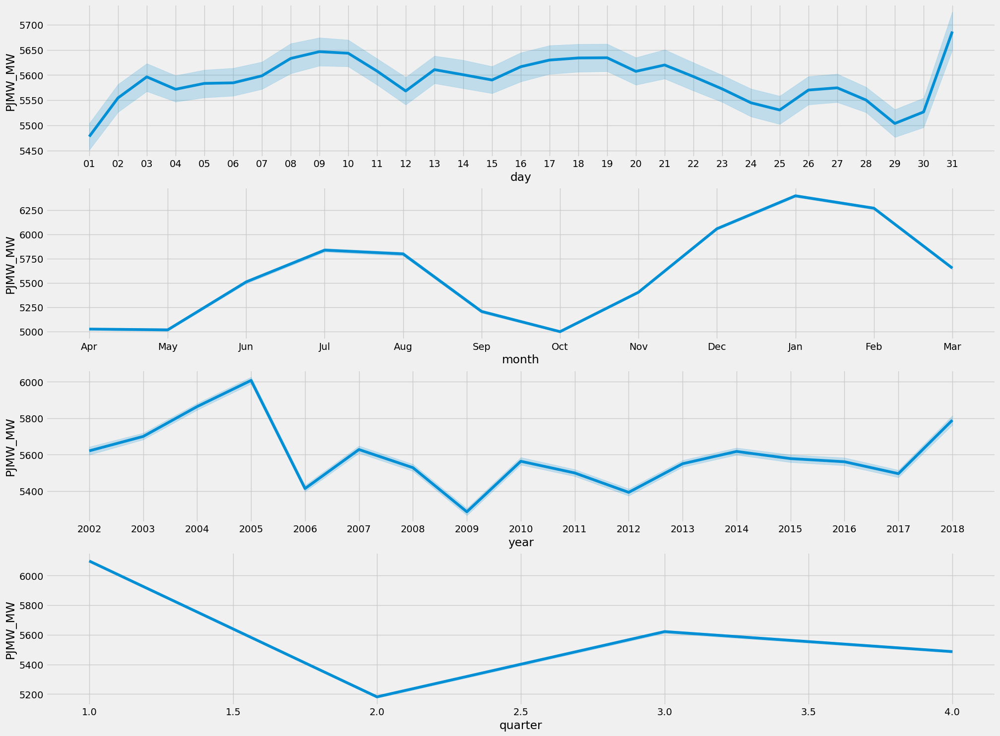

In [72]:
plt.figure(figsize= (30,22))
plt.subplot(511)
sns.lineplot(x='Hour', y= 'PJMW_MW', data= df1)

plt.figure(figsize= (22,22))
plt.subplot(512)
sns.lineplot(x='day', y= 'PJMW_MW', data= df1)

plt.subplot(513)
sns.lineplot(x='month', y= 'PJMW_MW', data= df1)

plt.subplot(514)
sns.lineplot(x='year', y= 'PJMW_MW', data= df1)

plt.subplot(515)
sns.lineplot(x='quarter', y= 'PJMW_MW', data= df1)

## ACF and PACF Plot

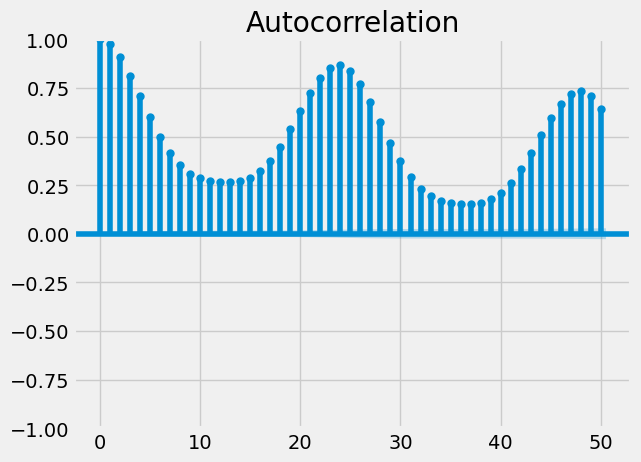

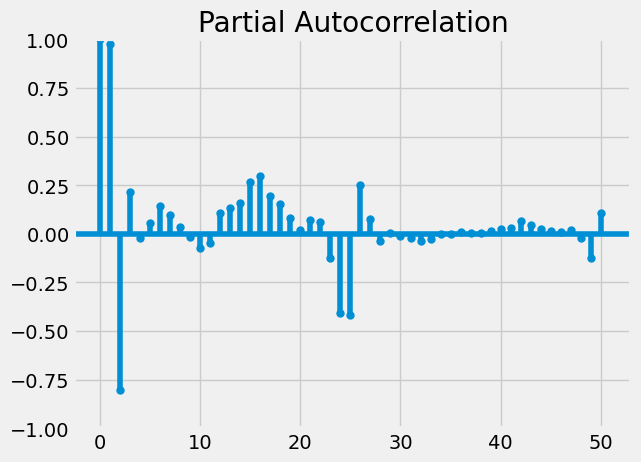

In [74]:
# Create an autocorrelation plot 
from statsmodels.graphics.tsaplots import plot_acf
import statsmodels.graphics.tsaplots as tsa_plots
tsa_plots.plot_acf(df1.PJMW_MW, lags= 50)
tsa_plots.plot_pacf(df1.PJMW_MW,lags= 50)
plt.show();

## Cat Plot

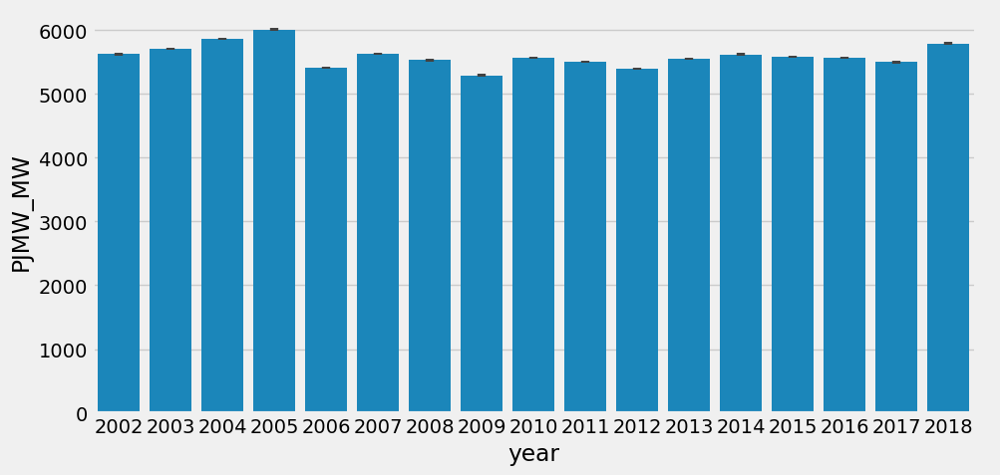

In [76]:
sns.catplot(x='year',y='PJMW_MW',data=df1,kind='bar',aspect=2)

Observation: Low consumption in 2009 and high consumption in 2005

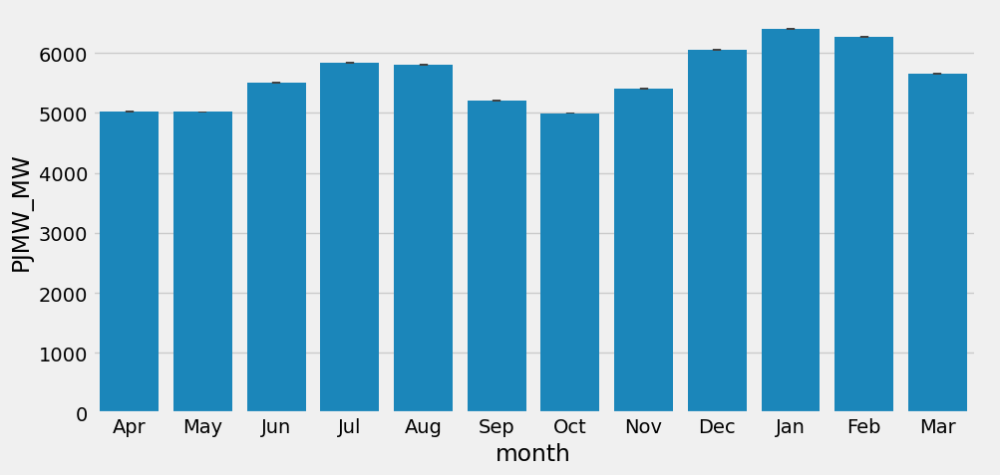

In [78]:
sns.catplot(x='month',y='PJMW_MW',data=df1,kind='bar',aspect=2)

Observation: For Dec, Jan, Feb and Jun,Jul, Aug the consumptin is higher as compared to other months.

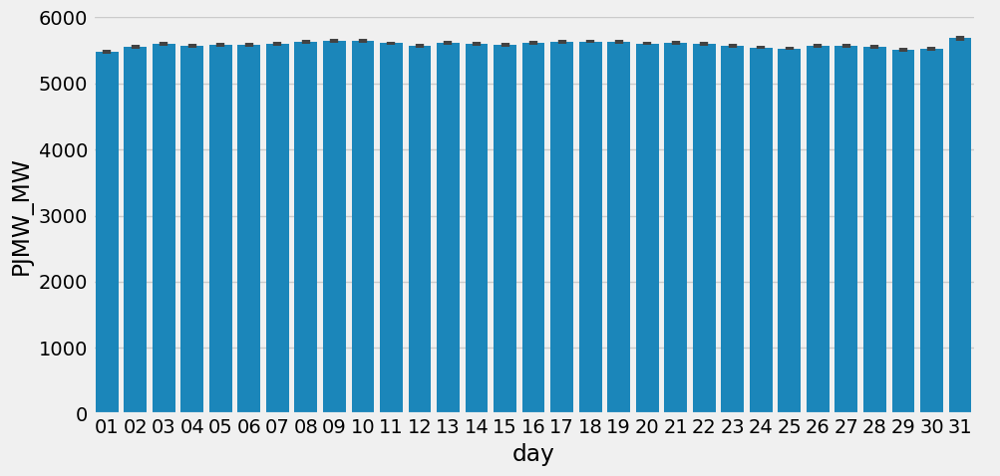

In [80]:
sns.catplot(x='day',y='PJMW_MW',data=df1,kind='bar',aspect=2)

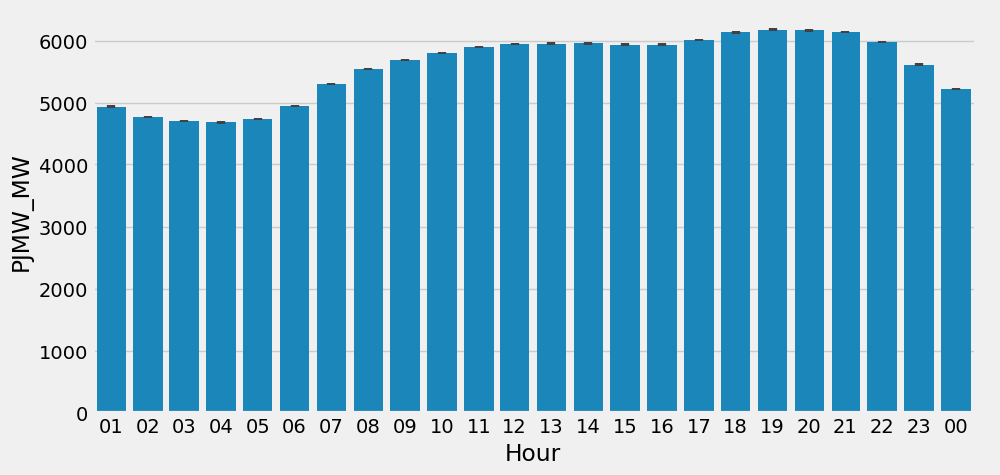

In [81]:
sns.catplot(x='Hour',y='PJMW_MW',data=df1,kind='bar',aspect=2)

Observation: From midnight after 10 pm the power consumption starts decreasing and from morning 7 it increases till 10 pm.

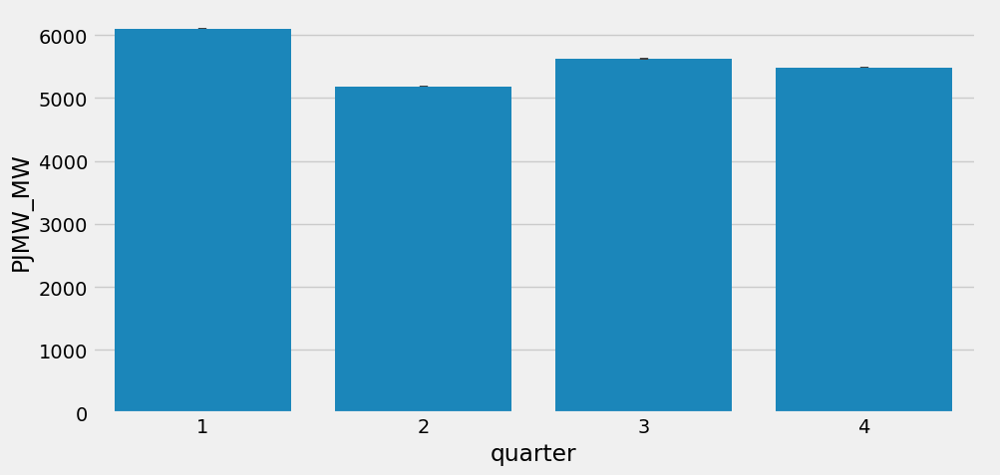

In [83]:
sns.catplot(x='quarter',y='PJMW_MW',data=df1,kind='bar',aspect=2)

Observation: 1st quarter has the highest power consumption and 2nd quarter has the lowest power consumption

## Violin Plot

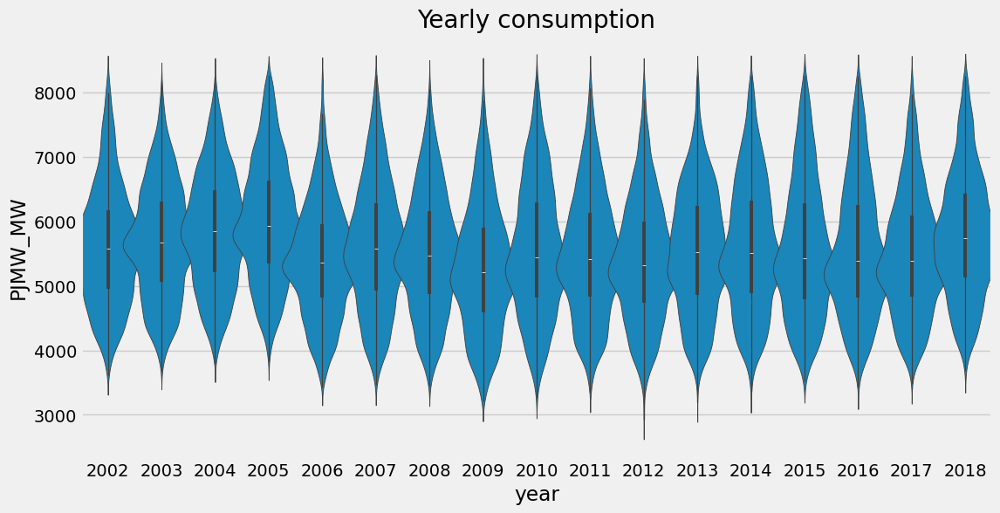

In [86]:
# set the size of the figure
plt.figure(figsize=(12, 6))

# create the violin plot
plot1 = sns.violinplot(x='year', y='PJMW_MW', data=df1, width=1.5, gridsize=100)
plot1.set(title='Yearly consumption')

# display the plot
plt.show()

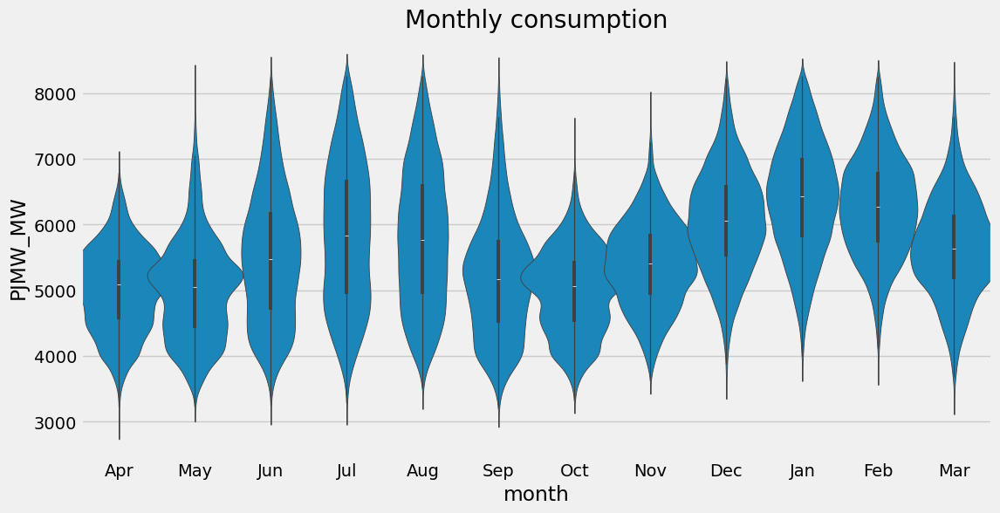

In [87]:
# set the size of the figure
plt.figure(figsize=(12, 6))

# create the violin plot
plot1 = sns.violinplot(x='month', y='PJMW_MW', data=df1, width=1.5, gridsize=100)
plot1.set(title='Monthly consumption')

# display the plot
plt.show()

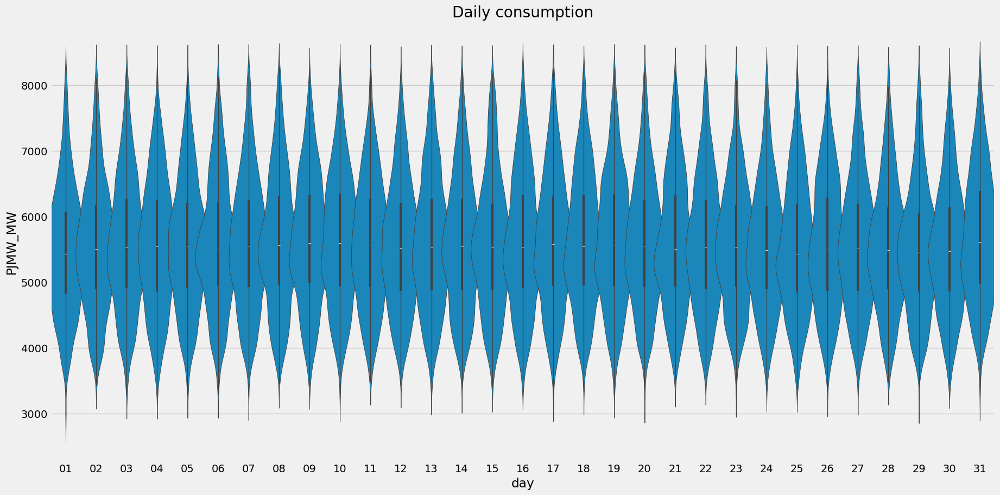

In [88]:
# set the size of the figure
plt.figure(figsize=(20, 10))

# create the violin plot
plot1 = sns.violinplot(x='day', y='PJMW_MW', data=df1, width=1.5, gridsize=100)
plot1.set(title='Daily consumption')

# display the plot
plt.show()

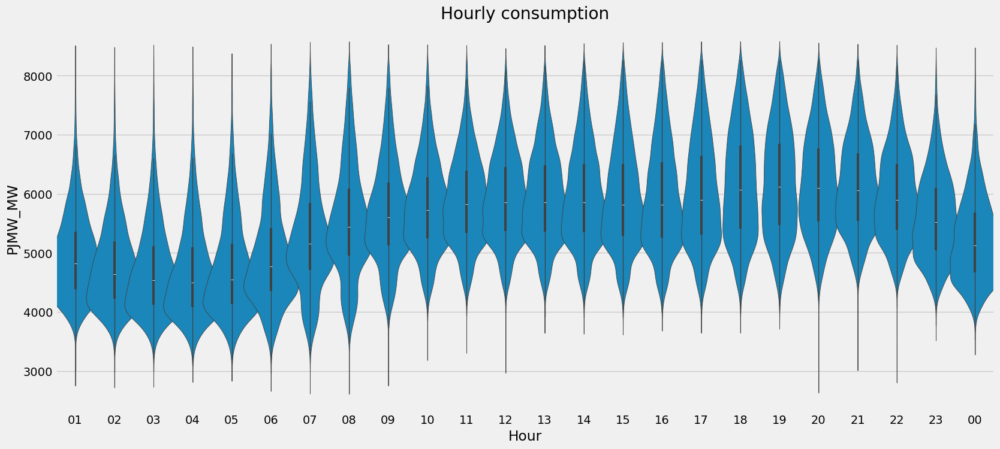

In [89]:
# set the size of the figure
plt.figure(figsize=(18, 8))

# create the violin plot
plot1 = sns.violinplot(x='Hour', y='PJMW_MW', data=df1, width=1.5, gridsize=100)
plot1.set(title='Hourly consumption')

# display the plot
plt.show()

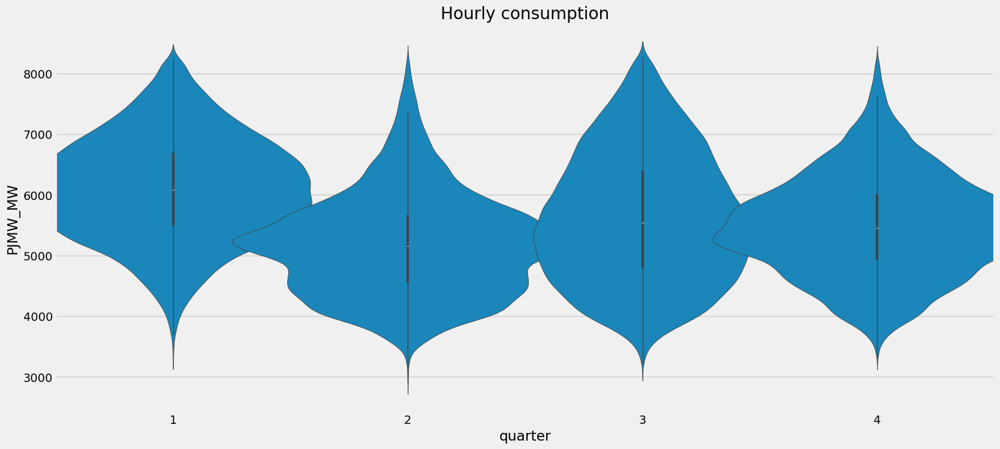

In [90]:
# set the size of the figure
plt.figure(figsize=(18, 8))

# create the violin plot
plot1 = sns.violinplot(x='quarter', y='PJMW_MW', data=df1, width=1.5, gridsize=100)
plot1.set(title='Hourly consumption')

# display the plot
plt.show()

## Moving Average

In [92]:
print(df1.dtypes)

PJMW_MW          int64
month           object
year            object
day             object
Hour            object
quarter          int32
weekday_name    object
dtype: object


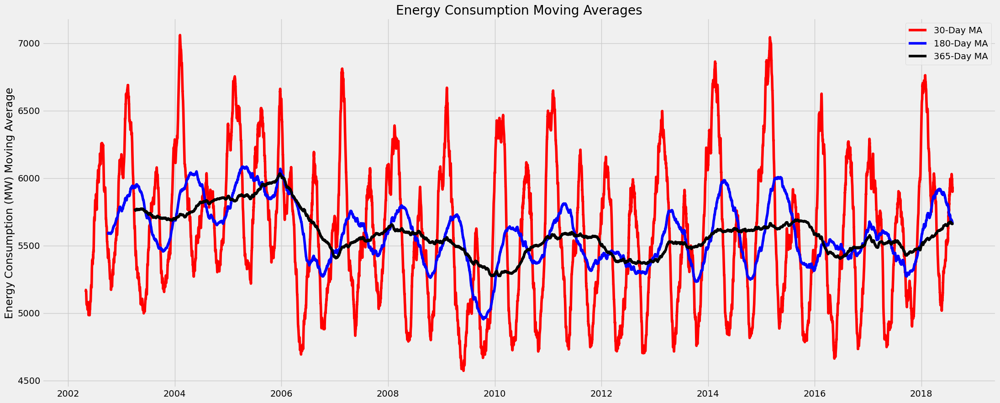

In [93]:
MONTH_PERIOD = 24 * 30
MIDYEAR_PERIOD = 24 * 182
YEAR_PERIOD = 24 * 365

# Use only numeric columns for all rolling operations
df_numeric = df1.select_dtypes(include='number')

# Rolling means
month_roll = df_numeric.rolling(MONTH_PERIOD).mean()
midyear_roll = df_numeric.rolling(MIDYEAR_PERIOD).mean()
year_roll = df_numeric.rolling(YEAR_PERIOD).mean()

# Plotting
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(24, 10))
plt.plot(month_roll.index, month_roll['PJMW_MW'], color='red', label='30-Day MA')
plt.plot(midyear_roll.index, midyear_roll['PJMW_MW'], color='blue', label='180-Day MA')
plt.plot(year_roll.index, year_roll['PJMW_MW'], color='black', label='365-Day MA')
plt.title('Energy Consumption Moving Averages')
plt.ylabel('Energy Consumption (MW) Moving Average')
plt.legend()
plt.show()


In [94]:
df2=df1.copy()

In [95]:
df2.index.name= 'Datetime'

In [96]:
df2

,PJMW_MW,month,year,day,Hour,quarter,weekday_name
Datetime,,,,,,,
2002-04-01 01:00:00,4374,Apr,2002,01,01,2,Monday
2002-04-01 02:00:00,4306,Apr,2002,01,02,2,Monday
2002-04-01 03:00:00,4322,Apr,2002,01,03,2,Monday
2002-04-01 04:00:00,4359,Apr,2002,01,04,2,Monday
2002-04-01 05:00:00,4436,Apr,2002,01,05,2,Monday
...,...,...,...,...,...,...,...
2018-08-02 20:00:00,6545,Aug,2018,02,20,3,Thursday
2018-08-02 21:00:00,6496,Aug,2018,02,21,3,Thursday
2018-08-02 22:00:00,6325,Aug,2018,02,22,3,Thursday


In [97]:
df2.describe()

,PJMW_MW,quarter
count,142503.000000,142503.000000
mean,5588.247384,2.506881
std,959.088761,1.107114
min,2922.000000,1.000000
25%,4902.000000,2.000000
50%,5524.000000,2.000000
75%,6239.000000,3.000000
max,8269.000000,4.000000


In [98]:
df3=df2.copy()

#### Create the column 'Season' to Check for the seasonal trend

In [100]:
df3['season']=df3['month'].copy()

In [101]:
df3['season']=df3['season'].map({'Jan':'Winter','Feb':'Winter','Mar':'Winter','Apr':'Spring','May':'Spring','Jun':'Spring','Aug':'Summer','Sep':'Summer','Jul':'Summer','Oct': 'Fall','Nov': 'Fall','Dec': 'Fall'})


In [102]:
df3.head()

,PJMW_MW,month,year,day,Hour,quarter,weekday_name,season
Datetime,,,,,,,,
2002-04-01 01:00:00,4374,Apr,2002,01,01,2,Monday,Spring
2002-04-01 02:00:00,4306,Apr,2002,01,02,2,Monday,Spring
2002-04-01 03:00:00,4322,Apr,2002,01,03,2,Monday,Spring
2002-04-01 04:00:00,4359,Apr,2002,01,04,2,Monday,Spring
2002-04-01 05:00:00,4436,Apr,2002,01,05,2,Monday,Spring


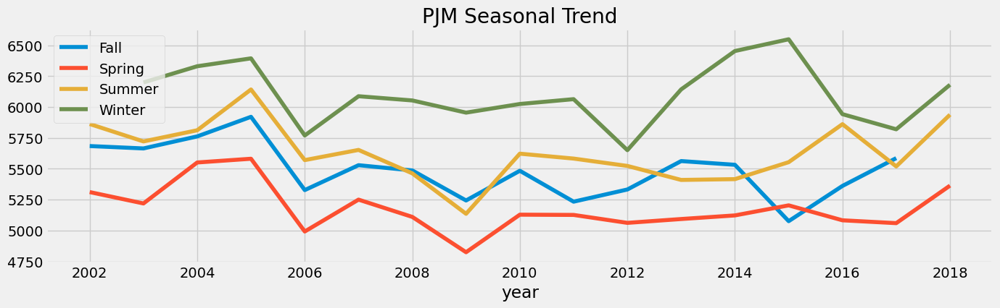

In [103]:
df3.pivot_table(index=df3['year'], 
                     columns='season', 
                     values='PJMW_MW',
                     aggfunc='mean').plot(figsize=(15,4),
                     title='PJM Seasonal Trend')
plt.legend(loc='upper left')

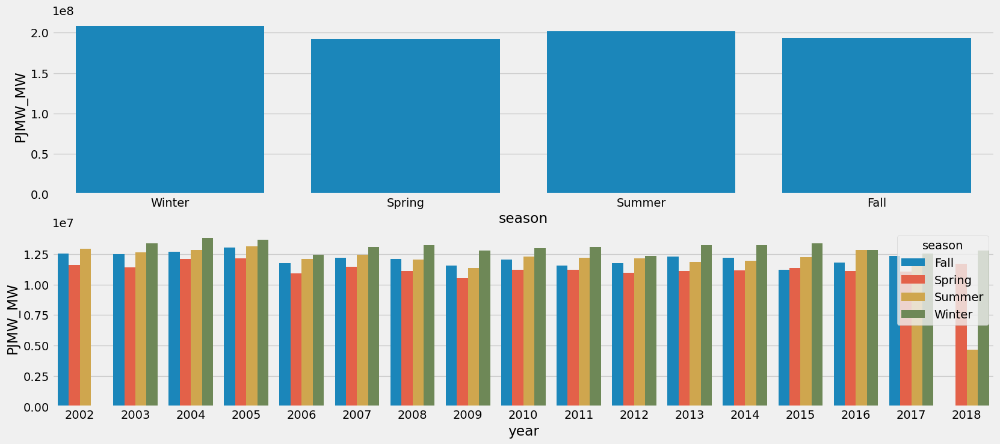

In [104]:
plt.figure(figsize=(18,8))
aux1 = df3[['season', 'PJMW_MW']].groupby( 'season' ).sum().reset_index()
plt.subplot( 2, 1, 1 )
sns.barplot( x='season', y='PJMW_MW', data=aux1, order=['Winter', 'Spring', 'Summer', 'Fall'] )

aux2 = df3[['year', 'season', 'PJMW_MW']].groupby( ['year', 'season'] ).sum().reset_index()
plt.subplot( 2, 1, 2 )
sns.barplot( x='year', y='PJMW_MW', hue='season', data=aux2 );

Observation: For winter season the energy consumption is on a higher side and for spring the consumption is comparatively low

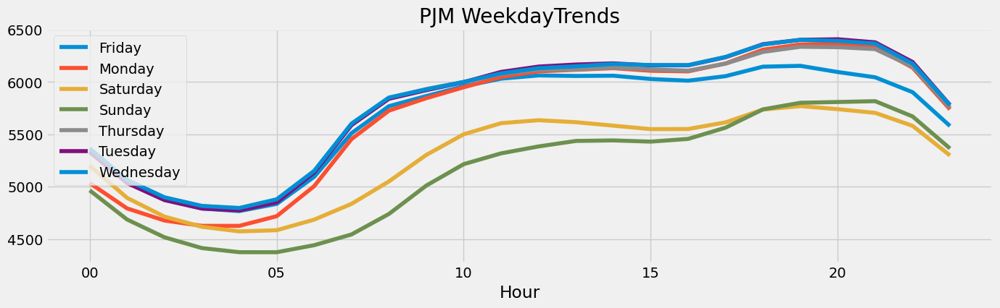

In [106]:
df2.pivot_table(index=df2['Hour'], 
                     columns='weekday_name', 
                     values='PJMW_MW',
                     aggfunc='mean').plot(figsize=(15,4),
                     title='PJM WeekdayTrends')
plt.legend(loc='upper left')

Observation: The plot shows that there are less consumption of power during weekends as compared to weekdays. Also the power consumption began to rise from morning 7 and at midnight 10 it again decreases.

In [108]:
df3['date'] = df3.index.date

In [109]:
df4=df3.reset_index()


#### Check for the Holiday trend

In [111]:
#import holidays
#df4['holidays'] = df4.date.apply( lambda x: 'Holiday' if x in holidays.US() else 'Normal day' )

In [112]:
import holidays

us_holidays = holidays.US(years=2023) # Generate a list of US holidays for 2023

df4['holidays'] = df4.date.apply(lambda x: 'Holiday' if x in us_holidays else 'Normal day')


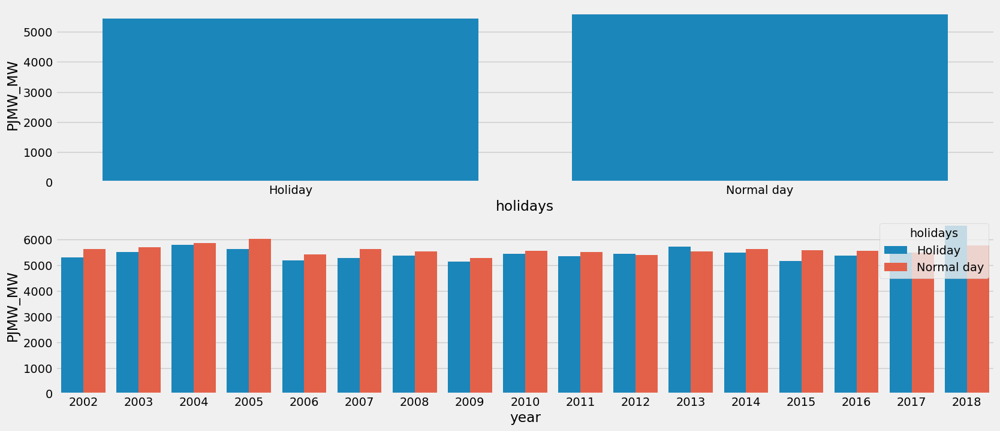

In [113]:
plt.figure(figsize=(18,8))

aux1 = df4[['holidays', 'PJMW_MW']].groupby( 'holidays' ).mean().reset_index()
plt.subplot( 2, 1, 1 )
sns.barplot( x='holidays', y='PJMW_MW', data=aux1 )

aux2 = df4[['year', 'holidays', 'PJMW_MW']].groupby( ['year', 'holidays'] ).mean().reset_index()
plt.subplot( 2, 1, 2 )
sns.barplot( x='year', y='PJMW_MW', hue='holidays', data=aux2 );

## Time Series Decomposition Plot
We will de-compose the time series into trend, seasonal and residuals

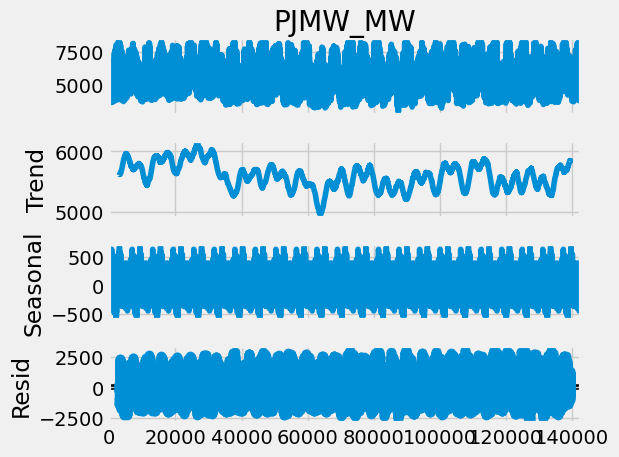

In [115]:
decompose = seasonal_decompose(df4.PJMW_MW,period=6205)
decompose.plot()
plt.show()

This graph gives us an overall trend in our data from year 2002 till year 2018.
Seasonality cannot be checked as the datapoints are too many.

##### Lets resample and aggregate up to weekly level to reduce the noise

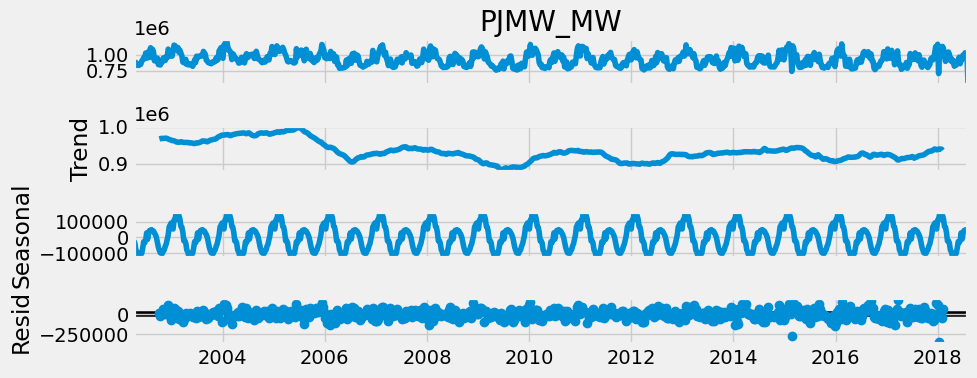

In [118]:
plt.rcParams["figure.figsize"]= (10,4)
weekly_data = df2.PJMW_MW.resample(rule='W').sum()
decomposition = seasonal_decompose(weekly_data, model='additive') # Aggregate to weekly level
fig = decomposition.plot()
plt.show()

Observations:
There is no trend since its not increasing or decreasing.
Seasonal pattern is consistent
Resduals are whetever is left after fitting the trend and seasonal components to the observed data. It's the component we cannot explain. We want the residuals to be i.i.d (i.e uncorrelated). If the residuals have a pattern, it means there is still some structural information left to be captured. Residuals are showing some wavy pattern, which is not good. Let's perform **Ljung Box test** to confirm if they are i.i.d as a group.
We do not want to see any recognizable patterns in the residuals, e.g. waves, upward/downward slope, funnel pattern etc.

### Ljung Box test

In [121]:
from statsmodels.stats.diagnostic import acorr_ljungbox
acorr_ljungbox(df, lags=[1], return_df=True)

,lb_stat,lb_pvalue
1,135126.327161,0.0


Since lb_pvalue < 0.05, residuals are uncorrelated. If the residuals are correlated, we can perform transformations to see if it stabilizes the variance. It's also an indication that we may need to use exogenous variable to fully explain the time series behaviour or use higher order models.
In this case, the residuals are uncorrelated.

#### Augmented Dickey-fuller test

In [124]:
from statsmodels.tsa.stattools import adfuller
dftest = adfuller(df4.PJMW_MW , autolag= 'AIC')
print("1. ADF :" , dftest[0])
print("2. P-Value :" , dftest[1])
print("3. Num of lags :" , dftest[2])
print("4. No of obs used for ADF regression and critical value calculation :" , dftest[3])
print("5. Critical Values: ")
for key, val in dftest[4].items():
    print("\t",key, ": " , val)

1. ADF : -19.305538637758378
2. P-Value : 0.0
3. Num of lags : 73
4. No of obs used for ADF regression and critical value calculation : 142429
5. Critical Values: 
	 1% :  -3.4303959135278568
	 5% :  -2.861560293126604
	 10% :  -2.5667808013095796


Our p-value is definitely less than 0.05 and so we can say with pretty good confidence that we can reject the null (unit root, non-stationary data) and can assume our data is stationary.

#### Downsample data to daily basis

In [127]:
print(df2.columns)

Index(['PJMW_MW', 'month', 'year', 'day', 'Hour', 'quarter', 'weekday_name'], dtype='object')


In [128]:
print(df2)

                     PJMW_MW month  year day Hour  quarter weekday_name
Datetime                                                               
2002-04-01 01:00:00     4374   Apr  2002  01   01        2       Monday
2002-04-01 02:00:00     4306   Apr  2002  01   02        2       Monday
2002-04-01 03:00:00     4322   Apr  2002  01   03        2       Monday
2002-04-01 04:00:00     4359   Apr  2002  01   04        2       Monday
2002-04-01 05:00:00     4436   Apr  2002  01   05        2       Monday
...                      ...   ...   ...  ..  ...      ...          ...
2018-08-02 20:00:00     6545   Aug  2018  02   20        3     Thursday
2018-08-02 21:00:00     6496   Aug  2018  02   21        3     Thursday
2018-08-02 22:00:00     6325   Aug  2018  02   22        3     Thursday
2018-08-02 23:00:00     5892   Aug  2018  02   23        3     Thursday
2018-08-03 00:00:00     5489   Aug  2018  03   00        3       Friday

[142503 rows x 7 columns]


In [129]:
# Convert month names to numbers
df2['month'] = pd.to_datetime(df2['month'], format='%b').dt.month

In [130]:
# Step 1: Create a datetime column
df2['datetime'] = pd.to_datetime(df2[['year', 'month', 'day', 'Hour']])

# Step 2: Set it as index
df2.set_index('datetime', inplace=True)

# Step 3: Resample only numeric columns
daily_data = df2.select_dtypes(include='number').resample('D').mean()

# Step 4: Ensure continuous daily frequency
daily_data = daily_data.asfreq('D')

In [131]:
daily_data.head(5)

,PJMW_MW,month,quarter
datetime,,,
2002-04-01,5271.173913,4.0,2.0
2002-04-02,5310.416667,4.0,2.0
2002-04-03,5325.916667,4.0,2.0
2002-04-04,5670.791667,4.0,2.0
2002-04-05,5686.125000,4.0,2.0


### Differencing the daily data to remove seasonality

C:\Users\anura\AppData\Local\Temp\ipykernel_14780\73994960.py:6: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



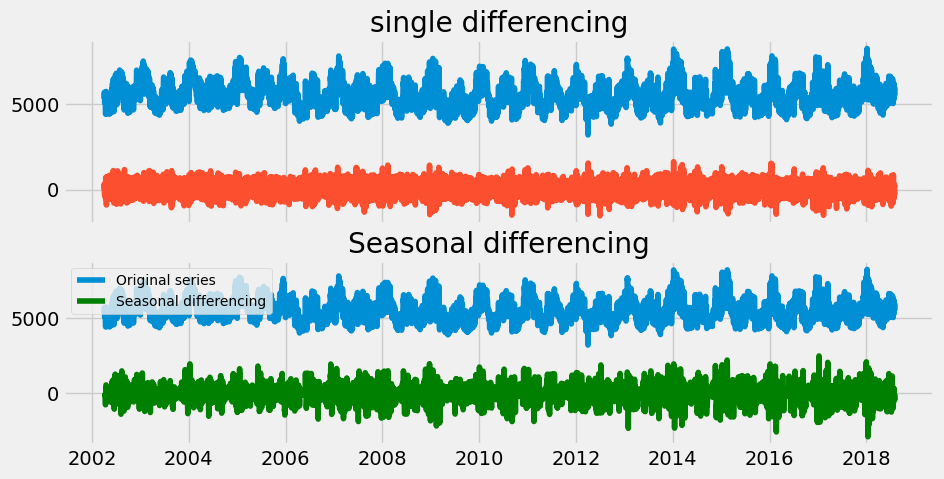

In [133]:
fig, axes = plt.subplots(2,1,figsize=(10,5),dpi=100,sharex=True)
data=daily_data.PJMW_MW
axes[0].plot(data[:], label = "Original series")
axes[0].plot(data[:].diff(1), label = "single differencing")
axes[0].set_title("single differencing")
plt.legend(loc='upper left', fontsize=10)

#Second differencing with 7 lags

axes[1].plot(data[:], label = "Original series")
axes[1].plot(data[:].diff(7), label = "Seasonal differencing",color='green')
axes[1].set_title("Seasonal differencing")
plt.legend(loc='upper left', fontsize=10)

plt.show()

# Splitting of data

In [135]:
# Before building and training our model, let's split the data into training and testing
df1_train, df1_test = df1[df1.index < '2017-08-03 0:00:00'], df1[df1.index >= '2017-08-03 0:00:00']

print('Train:\t', len(df1_train))
print('Test:\t', len(df1_test))

Train:	 133852
Test:	 8651


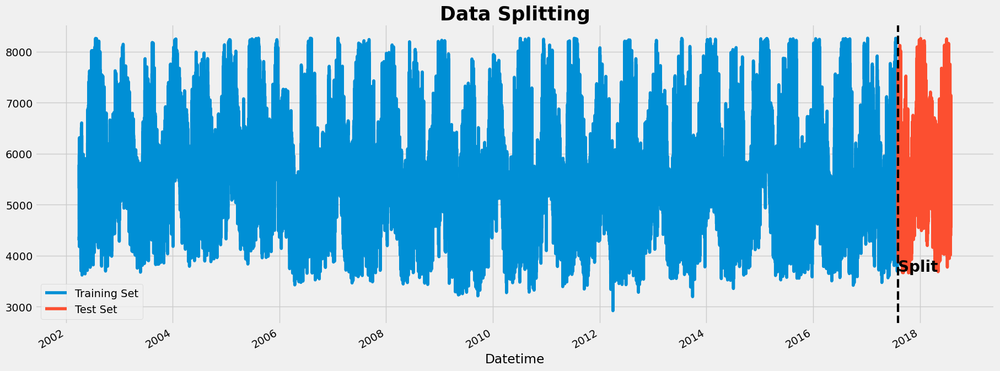

In [136]:
plt.figure(figsize=(20,8))

df1_train['PJMW_MW'].plot(label='Training Set')
df1_test['PJMW_MW'].plot(label='Test Set')
plt.axvline('2017-08-03 0:00:00', color='black', ls='--', lw=3)
plt.text('2017-08-03 0:00:00', 3700, 'Split', fontsize=20, fontweight='bold')
plt.title('Data Splitting', weight='bold', fontsize=25)
plt.legend()

# Model Building:
## 1. Prophet Model
Prophet is an open-source library for univariate (one variable) time series forecasting developed by Facebook. 
It works best with time series that have strong seasonal effects and several seasons of historical data

In [138]:
def index_to_column(df1):
    df1 = df1.reset_index()
    df1['Datetime'] = pd.to_datetime(df1['Datetime'])
    df1 = df1.sort_values('Datetime')
    
    df1 = df1.rename(columns={'Datetime': 'ds', 'PJMW_MW': 'y'})
    return df1

In [139]:
df1.head()

,PJMW_MW,month,year,day,Hour,quarter,weekday_name
Datetime,,,,,,,
2002-04-01 01:00:00,4374,Apr,2002,01,01,2,Monday
2002-04-01 02:00:00,4306,Apr,2002,01,02,2,Monday
2002-04-01 03:00:00,4322,Apr,2002,01,03,2,Monday
2002-04-01 04:00:00,4359,Apr,2002,01,04,2,Monday
2002-04-01 05:00:00,4436,Apr,2002,01,05,2,Monday


In [140]:
prophet_train = index_to_column(df1_train)
prophet_test = index_to_column(df1_test)

In [141]:
prophet_model = Prophet(interval_width=0.95)

prophet_model.fit(prophet_train)
prophet_pred = prophet_model.predict(prophet_test[['ds']]) # Keep the dataset format

18:38:29 - cmdstanpy - INFO - Chain [1] start processing
18:40:26 - cmdstanpy - INFO - Chain [1] done processing


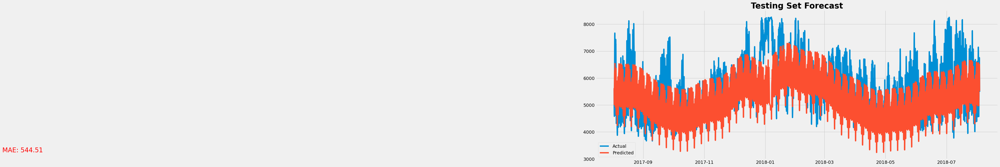

In [142]:
mae = round(mean_absolute_error(prophet_test['y'], prophet_pred['yhat']), 3)

plt.figure(figsize=(20,8))
plt.plot(prophet_test['ds'], prophet_test['y'], label='Actual')
plt.plot(prophet_pred['ds'], prophet_pred['yhat'], label='Predicted')
plt.title('Test Forecasting', weight='bold', fontsize=40)
plt.text(16770, 3250, 'MAE: {}'.format(mae), fontsize=20, color='red')
plt.title('Testing Set Forecast', weight='bold', fontsize=25)
plt.legend()

In [143]:
from sklearn.metrics import mean_squared_error

In [144]:
score = np.sqrt(mean_squared_error(prophet_test['y'], prophet_pred['yhat']))
print(f'RMSE Score on Test Set: {score: 0.2f}')

RMSE Score on Test Set:  719.93


In [145]:
# This time, we will use all data (train and test) to train our model
new_df = index_to_column(df1)

### Predict the value for next 30 days

In [147]:
prophet_model2 = Prophet(interval_width=0.95)
prophet_model2.fit(new_df)
# 30 days to the future (30x24 = 720)
future_dates = prophet_model2.make_future_dataframe(periods=720, freq='H')
prophet_pred2 = prophet_model2.predict(future_dates)

18:40:40 - cmdstanpy - INFO - Chain [1] start processing
18:43:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\anura\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1872: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.



C:\Users\anura\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1872: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.



<Figure size 2000x800 with 0 Axes>

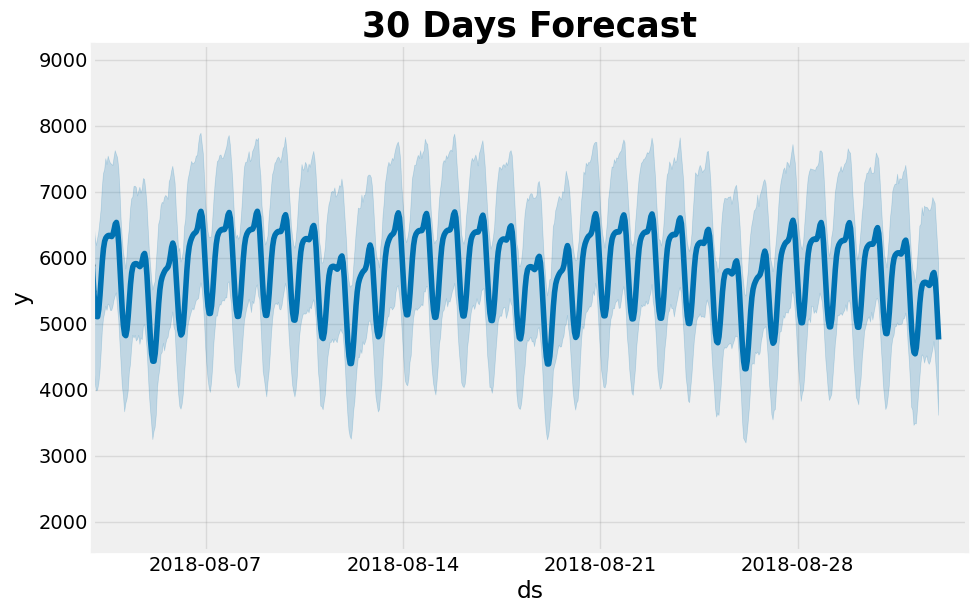

In [148]:
future_dates2 = prophet_model2.make_future_dataframe(periods=720, freq='H')
prophet_pred3 = prophet_model2.predict(future_dates2)

plt.figure(figsize=(20,8))

fig = prophet_model2.plot(prophet_pred3, uncertainty=True)
ax = fig.gca()
ax.set_xlim(pd.to_datetime(['2018-08-03 0:00:00', '2018-09-03 0:00:00']))
plt.title('30 Days Forecast', weight='bold', fontsize=25)
plt.show()

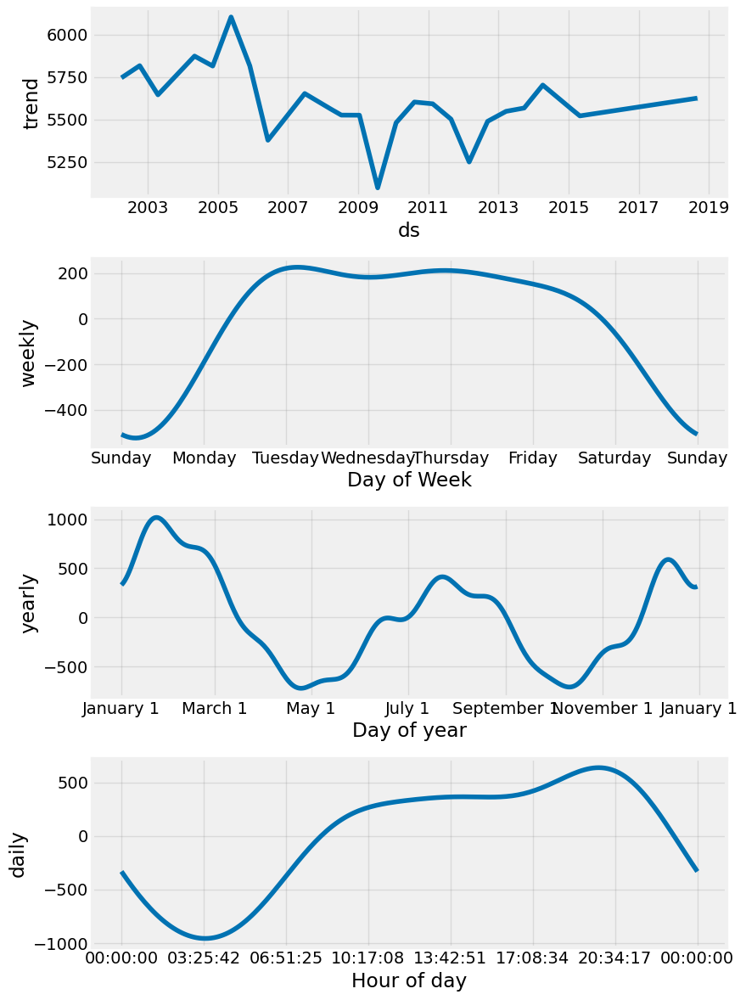

In [149]:
prophet_model.plot_components(prophet_pred2)
plt.show()

## 2. Deep Neural Network
The Deep Learning framework we are using is Tensorflow

Before feeding the data into Neural Network, we have to do some modification to the data so they can be accepted by the model. We are going to use windowing technique which basically group the data into feature and label. The label will be the next value. You can take a look at the next few cells to give an idea what we are going to do


### df1 dataset, which only contains 2 columns: Datetime & PJMW_MW

### Build and train the model

In [153]:
cf.shape

(142503, 1)

In [154]:
# Before building and training our model, let's split the data into training and testing
cf_train, cf_test = cf[cf.index < '2017-08-03 0:00:00'], cf[cf.index >= '2017-08-03 0:00:00']

print('Train:\t', len(cf_train))
print('Test:\t', len(cf_test))

Train:	 133852
Test:	 8651


In [155]:
def windowing(data, window_size, shuffle_buffer, batch_size):
    dataset = tf.expand_dims(data, axis=-1)
    dataset = tf.data.Dataset.from_tensor_slices(dataset)
    dataset = dataset.window(window_size+1, shift=1, drop_remainder=True) # window size = 24 + 1 (test)
    dataset = dataset.flat_map(lambda window: window.batch(window_size+1))
    dataset = dataset.map(lambda window: (window[:-1], window[-1])) # (train, test) 
    dataset = dataset.shuffle(shuffle_buffer)
    dataset = dataset.batch(batch_size).prefetch(1)
    
    return dataset

In [156]:
train = windowing(cf_train['PJMW_MW'], 24, 72, 32)
test = windowing(cf_test['PJMW_MW'], 24, 72, 32)

In [157]:
dnn_model = tf.keras.models.Sequential([
    tf.keras.layers.Conv1D(filters=16, kernel_size=3,
                      strides=1, padding="causal",
                      activation="relu",
                      input_shape=[24,1]),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(16, activation='relu')),
    tf.keras.layers.Dense(16),
    tf.keras.layers.Dense(1)
])

dnn_model.summary()

C:\Users\anura\AppData\Roaming\Python\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                      │ (None, 24, 16)              │              64 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 32)                  │           4,224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              17 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,833 (18.88 KB)

 Trainable params: 4,833 (18.88 KB)

 Non-trainable params: 0 (0.00 B)

In [158]:
dnn_model.compile(loss='mae', optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
dnn_model.fit(train, validation_data=test, epochs=20)

Epoch 1/20
   4183/Unknown 85s 19ms/step - loss: 954.9426

C:\Users\anura\AppData\Roaming\Python\Python312\site-packages\keras\src\trainers\epoch_iterator.py:151: UserWarning:

Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.



4183/4183 ━━━━━━━━━━━━━━━━━━━━ 88s 19ms/step - loss: 954.8234 - val_loss: 366.6263
Epoch 2/20
4183/4183 ━━━━━━━━━━━━━━━━━━━━ 79s 19ms/step - loss: 250.0722 - val_loss: 168.0693
Epoch 3/20
4183/4183 ━━━━━━━━━━━━━━━━━━━━ 81s 19ms/step - loss: 114.4617 - val_loss: 86.6952
Epoch 4/20
4183/4183 ━━━━━━━━━━━━━━━━━━━━ 616s 147ms/step - loss: 88.0631 - val_loss: 86.6690
Epoch 5/20
4183/4183 ━━━━━━━━━━━━━━━━━━━━ 81s 19ms/step - loss: 78.4055 - val_loss: 78.7586
Epoch 6/20
4183/4183 ━━━━━━━━━━━━━━━━━━━━ 81s 19ms/step - loss: 83.1367 - val_loss: 73.5481
Epoch 7/20
4183/4183 ━━━━━━━━━━━━━━━━━━━━ 79s 19ms/step - loss: 78.0216 - val_loss: 70.3251
Epoch 8/20
4183/4183 ━━━━━━━━━━━━━━━━━━━━ 81s 19ms/step - loss: 75.0764 - val_loss: 70.9601
Epoch 9/20
4183/4183 ━━━━━━━━━━━━━━━━━━━━ 78s 19ms/step - loss: 74.7626 - val_loss: 71.0902
Epoch 10/20
4183/4183 ━━━━━━━━━━━━━━━━━━━━ 81s 19ms/step - loss: 74.3404 - val_loss: 70.7554
Epoch 11/20
4183/4183 ━━━━━━━━━━━━━━━━━━━━ 82s 20ms/step - loss: 73.5973 - val_loss

<Axes: >

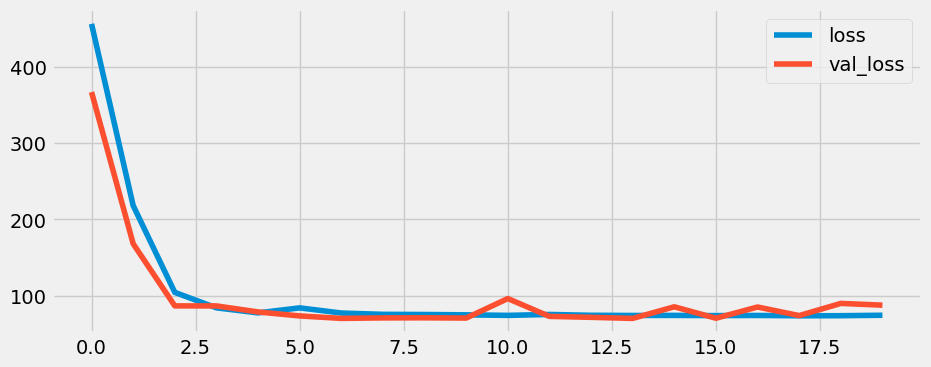

In [159]:
metric = pd.DataFrame(dnn_model.history.history)
metric.plot()

In [ ]:
window_size = 24
forecast = []

train_length = len(cf_train)
forecast_series = cf[train_length - window_size:]

# Use the model to predict data points per window size
for time in range(len(forecast_series) - window_size):
    forecast.append(dnn_model.predict(np.expand_dims(forecast_series[time:time + window_size], axis=-1)[np.newaxis]))

# Convert to a numpy array and drop single dimensional axes
results = np.array(forecast).squeeze()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 607ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━

C:\Users\anura\AppData\Local\Temp\ipykernel_14780\2562995542.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



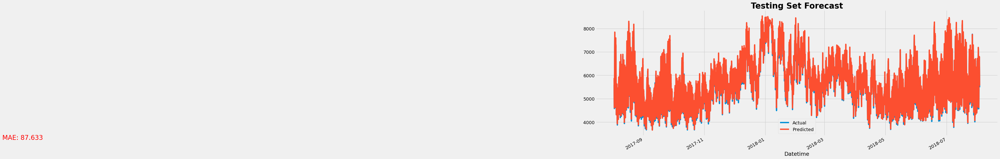

In [165]:
cf_test['Pred'] = results

mae = round(mean_absolute_error(cf_test['PJMW_MW'], cf_test['Pred']), 3)

plt.figure(figsize=(20,8))

cf_test['PJMW_MW'].plot(label='Actual')
cf_test['Pred'].plot(label='Predicted')
plt.text(16770, 3250, 'MAE: {}'.format(mae), fontsize=20, color='red')
plt.title('Testing Set Forecast', weight='bold', fontsize=25)
plt.legend()
plt.show()

C:\Users\anura\AppData\Local\Temp\ipykernel_14780\1762215839.py:20: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.



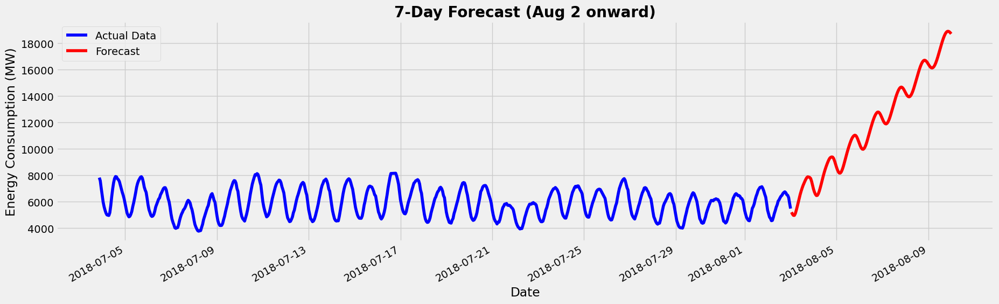

In [167]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

window_size = 24  # Define how many past hours you use for prediction

# Step 1: Initialize forecast window with the last 24 actual values (NOT predicted ones)
# It should be based on actual values to avoid feedback loop of predictions.
forecast_values = cf_test['PJMW_MW'][-window_size:].values.tolist()

# Step 2: Predict next 168 hours (7 days)
for _ in range(168):
    input_window = np.array(forecast_values[-window_size:], dtype=np.float32).reshape((1, window_size, 1))
    pred = dnn_model.predict(input_window, verbose=0)
    pred_value = float(pred.flatten()[0])  # Convert Tensor to scalar float
    forecast_values.append(pred_value)

# Step 3: Build DataFrame for forecast results
# Forecast Index starting from the next hour after the last known data
forecast_index = pd.date_range(start=cf_test.index[-1] + pd.Timedelta(hours=1), periods=168, freq='H')
cf_forecast = pd.DataFrame({'Pred': forecast_values[-168:]}, index=forecast_index)

# Step 4: Plot the forecast against actual values
plt.figure(figsize=(20, 6))

# Plot the last 30 days of actual data for context
cf_test['PJMW_MW'][-24*30:].plot(label='Actual Data', color='blue')

# Plot the forecasted 7 days
cf_forecast['Pred'].plot(label='Forecast', color='red')

plt.title("7-Day Forecast (Aug 2 onward)", fontsize=20, weight='bold')
plt.xlabel("Date")
plt.ylabel("Energy Consumption (MW)")
plt.grid(True)
plt.legend()
plt.show()


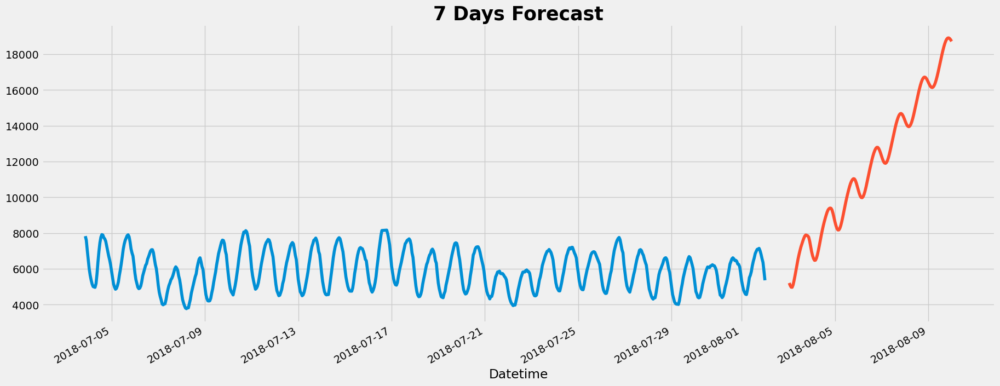

In [169]:
plt.figure(figsize=(20,8))

cf_test['PJMW_MW'][-720:-24].plot()
cf_forecast['Pred'].plot()
plt.title('7 Days Forecast', weight='bold', fontsize=25)
plt.show()

C:\Users\anura\AppData\Local\Temp\ipykernel_14780\323770613.py:25: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.



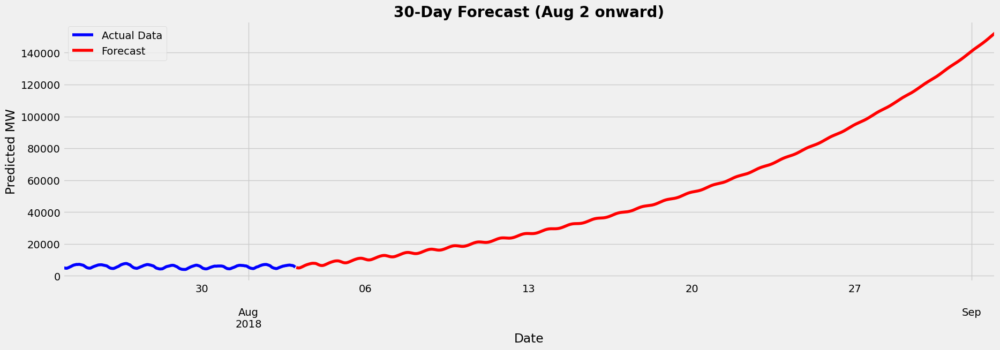

In [173]:
window_size = 24  # input window size (past 24 hours)

# Step 1: Initialize forecast_values with last 24 actual PJMW_MW values
forecast_values = cf_test['PJMW_MW'][-window_size:].values.tolist()

# List to store forecasted values
forecasted_preds = []

# Step 2: Predict next 720 hours (30 days)
for _ in range(720):
    # Prepare input window of shape (1, window_size, 1)
    input_window = np.array(forecast_values[-window_size:], dtype=np.float32).reshape((1, window_size, 1))
    
    # Predict next hour's value
    pred = dnn_model.predict(input_window, verbose=0)
    
    # Convert prediction tensor to float
    pred_value = float(pred.flatten()[0])
    
    # Append prediction to lists
    forecast_values.append(pred_value)
    forecasted_preds.append(pred_value)

# Step 3: Build DataFrame for forecast results
date_index = pd.date_range(start=cf_test.index[-1] + pd.Timedelta(hours=1), periods=720, freq='H')
cf_forecast = pd.DataFrame({'Pred': forecasted_preds}, index=date_index)

# Step 4: Plot the forecast
plt.figure(figsize=(20, 6))

# Plot last 10 days of actual data for context
cf_test['PJMW_MW'][-24*10:].plot(label='Actual Data', color='blue')

# Plot forecasted 30 days
cf_forecast['Pred'].plot(label='Forecast', color='red')

plt.title("30-Day Forecast (Aug 2 onward)", fontsize=20, weight='bold')
plt.xlabel("Date")
plt.ylabel("Predicted MW")
plt.grid(True)
plt.legend()
plt.show()


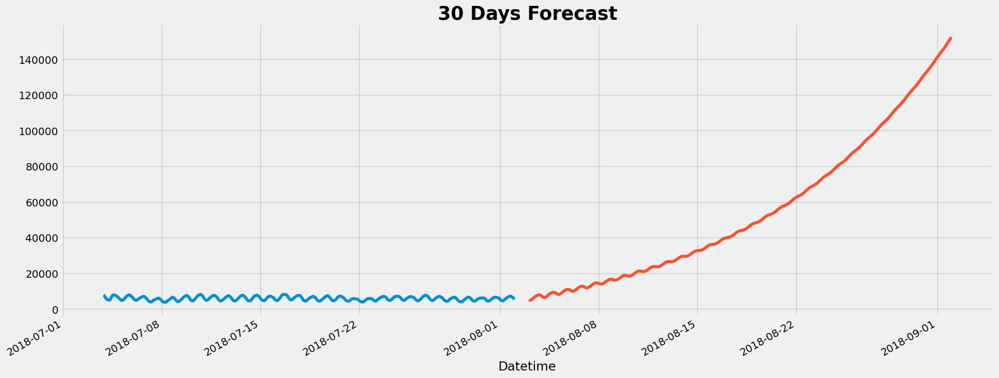

In [175]:
plt.figure(figsize=(20,8))

cf_test['PJMW_MW'][-720:-24].plot()
cf_forecast['Pred'].plot()
plt.title('30 Days Forecast', weight='bold', fontsize=25)
plt.show()

## The Forecast of Deep Neural Network(DNN) model is not satisfactory. 

# REGRESSION MODEL

In [179]:
from sklearn.metrics import mean_squared_error
from math import sqrt

<Axes: xlabel='Datetime'>

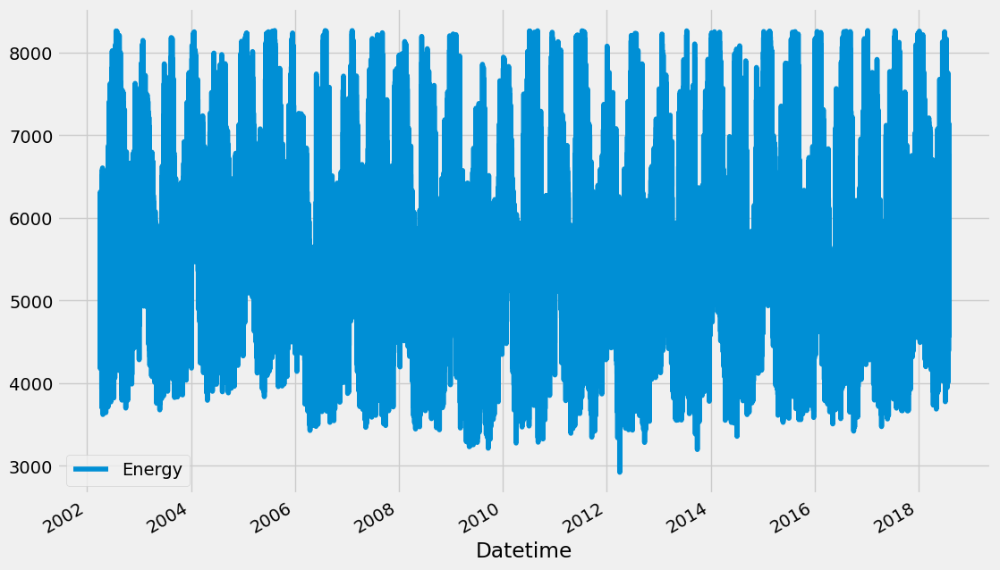

In [181]:
df.columns = ['Energy']
df.plot(figsize=(12,8))

In [183]:
daily_data = df.resample(rule='D').mean()
daily_data = daily_data.asfreq('D')

In [185]:
daily_data

,Energy
Datetime,
2002-04-01,5271.173913
2002-04-02,5310.416667
2002-04-03,5325.916667
2002-04-04,5670.791667
2002-04-05,5686.125000
...,...
2018-07-30,5492.708333
2018-07-31,5660.750000
2018-08-01,5959.708333


In [187]:
daily_data1=daily_data.copy()

In [189]:
daily_data['energy_1dayback']=daily_data['Energy'].shift(+1)
daily_data['energy_2dayback']=daily_data['Energy'].shift(+2)
daily_data['energy_3dayback']=daily_data['Energy'].shift(+3)
daily_data['energy_4dayback']=daily_data['Energy'].shift(+4)
daily_data['energy_5dayback']=daily_data['Energy'].shift(+5)
daily_data['energy_6dayback']=daily_data['Energy'].shift(+6)
daily_data['energy_7dayback']=daily_data['Energy'].shift(+7)

daily_data.head(10)

,Energy,energy_1dayback,energy_2dayback,energy_3dayback,energy_4dayback,energy_5dayback,energy_6dayback,energy_7dayback
Datetime,,,,,,,,
2002-04-01,5271.173913,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2002-04-02,5310.416667,5271.173913,NaN,NaN,NaN,NaN,NaN,NaN
2002-04-03,5325.916667,5310.416667,5271.173913,NaN,NaN,NaN,NaN,NaN
2002-04-04,5670.791667,5325.916667,5310.416667,5271.173913,NaN,NaN,NaN,NaN
2002-04-05,5686.125000,5670.791667,5325.916667,5310.416667,5271.173913,NaN,NaN,NaN
2002-04-06,5367.791667,5686.125000,5670.791667,5325.916667,5310.416667,5271.173913,NaN,NaN
2002-04-07,5060.652174,5367.791667,5686.125000,5670.791667,5325.916667,5310.416667,5271.173913,NaN
2002-04-08,5283.875000,5060.652174,5367.791667,5686.125000,5670.791667,5325.916667,5310.416667,5271.173913
2002-04-09,5136.083333,5283.875000,5060.652174,5367.791667,5686.125000,5670.791667,5325.916667,5310.416667


In [191]:
daily_data=daily_data.dropna()
daily_data

,Energy,energy_1dayback,energy_2dayback,energy_3dayback,energy_4dayback,energy_5dayback,energy_6dayback,energy_7dayback
Datetime,,,,,,,,
2002-04-08,5283.875000,5060.652174,5367.791667,5686.125000,5670.791667,5325.916667,5310.416667,5271.173913
2002-04-09,5136.083333,5283.875000,5060.652174,5367.791667,5686.125000,5670.791667,5325.916667,5310.416667
2002-04-10,5171.666667,5136.083333,5283.875000,5060.652174,5367.791667,5686.125000,5670.791667,5325.916667
2002-04-11,5207.875000,5171.666667,5136.083333,5283.875000,5060.652174,5367.791667,5686.125000,5670.791667
2002-04-12,5090.416667,5207.875000,5171.666667,5136.083333,5283.875000,5060.652174,5367.791667,5686.125000
...,...,...,...,...,...,...,...,...
2018-07-30,5492.708333,5293.833333,5485.791667,5978.750000,6216.458333,6036.208333,6142.666667,5900.041667
2018-07-31,5660.750000,5492.708333,5293.833333,5485.791667,5978.750000,6216.458333,6036.208333,6142.666667
2018-08-01,5959.708333,5660.750000,5492.708333,5293.833333,5485.791667,5978.750000,6216.458333,6036.208333


In [193]:
daily_data1.to_csv('dataset_daily.csv')

In [195]:
import numpy as np
x1,x2,x3,x4,x5,x6,x7,y=daily_data['energy_1dayback'],daily_data['energy_2dayback'],daily_data['energy_3dayback'],daily_data['energy_4dayback'],daily_data['energy_5dayback'],daily_data['energy_6dayback'],daily_data['energy_7dayback'],daily_data['Energy']
x1,x2,x3,x4,x5,x6,x7,y=np.array(x1),np.array(x2),np.array(x3),np.array(x4),np.array(x5),np.array(x6),np.array(x7),np.array(y)
x1,x2,x3,x4,x5,x6,x7,y=x1.reshape(-1,1),x2.reshape(-1,1),x3.reshape(-1,1),x4.reshape(-1,1),x5.reshape(-1,1),x6.reshape(-1,1),x7.reshape(-1,1),y.reshape(-1,1)
final_x=np.concatenate((x1,x2,x3,x4,x5,x6,x7),axis=1)
print(final_x)

[[5060.65217391 5367.79166667 5686.125      ... 5325.91666667
  5310.41666667 5271.17391304]
 [5283.875      5060.65217391 5367.79166667 ... 5670.79166667
  5325.91666667 5310.41666667]
 [5136.08333333 5283.875      5060.65217391 ... 5686.125
  5670.79166667 5325.91666667]
 ...
 [5660.75       5492.70833333 5293.83333333 ... 5978.75
  6216.45833333 6036.20833333]
 [5959.70833333 5660.75       5492.70833333 ... 5485.79166667
  5978.75       6216.45833333]
 [5805.04166667 5959.70833333 5660.75       ... 5293.83333333
  5485.79166667 5978.75      ]]


In [197]:
final_x

array([[5060.65217391, 5367.79166667, 5686.125     , ..., 5325.91666667,
        5310.41666667, 5271.17391304],
       [5283.875     , 5060.65217391, 5367.79166667, ..., 5670.79166667,
        5325.91666667, 5310.41666667],
       [5136.08333333, 5283.875     , 5060.65217391, ..., 5686.125     ,
        5670.79166667, 5325.91666667],
       ...,
       [5660.75      , 5492.70833333, 5293.83333333, ..., 5978.75      ,
        6216.45833333, 6036.20833333],
       [5959.70833333, 5660.75      , 5492.70833333, ..., 5485.79166667,
        5978.75      , 6216.45833333],
       [5805.04166667, 5959.70833333, 5660.75      , ..., 5293.83333333,
        5485.79166667, 5978.75      ]])

In [199]:
y

array([[5283.875     ],
       [5136.08333333],
       [5171.66666667],
       ...,
       [5959.70833333],
       [5805.04166667],
       [5489.        ]])

In [201]:
X_train,X_test,y_train,y_test=final_x[:-360],final_x[-360:],y[:-360],y[-360:]


# LR, RF and XGB Model

In [204]:
from sklearn.linear_model import LinearRegression
lin_model=LinearRegression()

In [206]:
from sklearn.ensemble import RandomForestRegressor
ran_model=RandomForestRegressor(n_estimators=100,max_features=3, random_state=1)

In [208]:
ran_model.fit(X_train,y_train)
lin_model.fit(X_train,y_train)


C:\Users\anura\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:1389: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



LinearRegression()

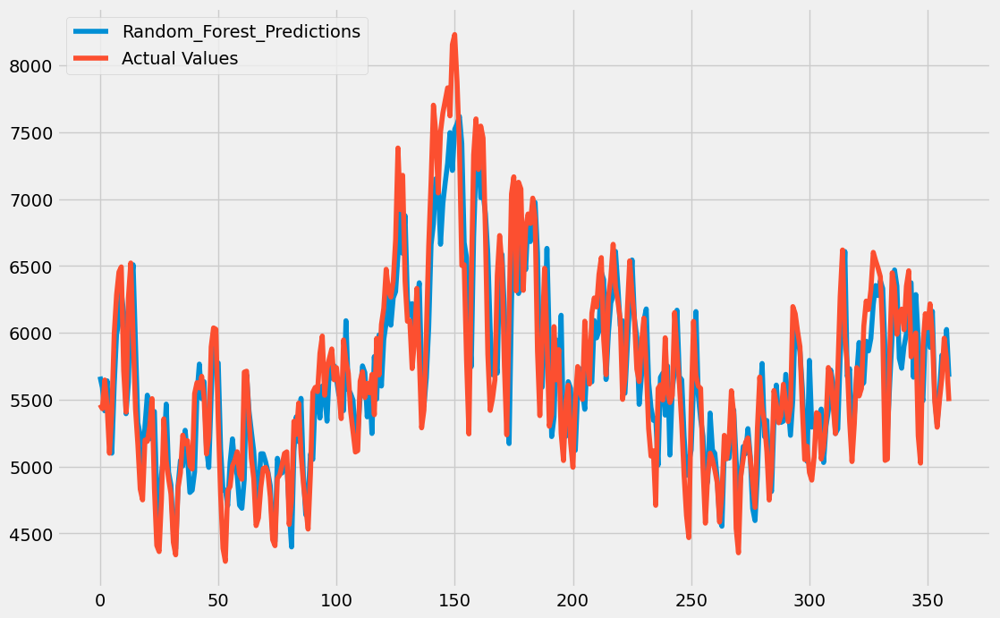

In [210]:
ran_pred=ran_model.predict(X_test)
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (12,8)
plt.plot(ran_pred,label='Random_Forest_Predictions')
plt.plot(y_test,label='Actual Values')
plt.legend(loc="upper left")
plt.show()

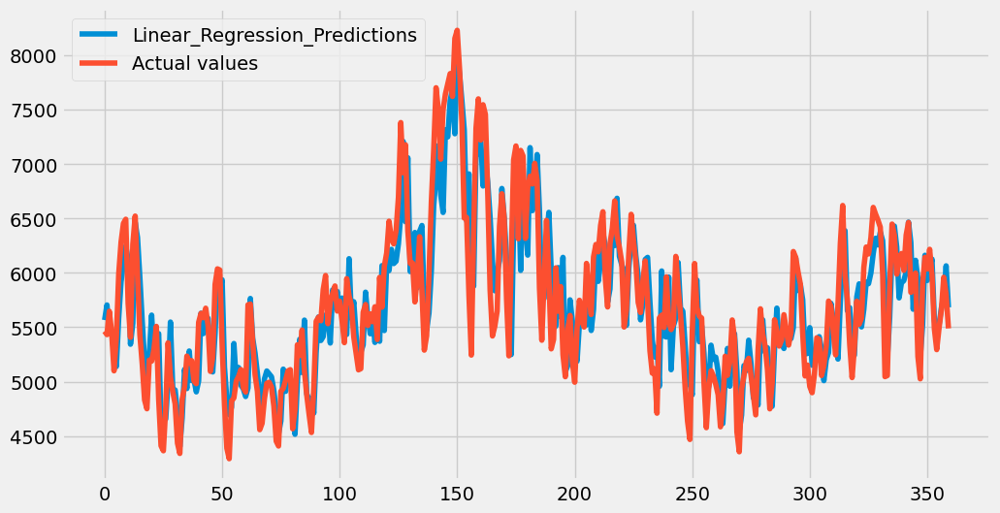

In [212]:
lin_pred=lin_model.predict(X_test)
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (11,6)
plt.plot(lin_pred,label='Linear_Regression_Predictions')
plt.plot(y_test,label='Actual values')
plt.legend(loc="upper left")
plt.show()

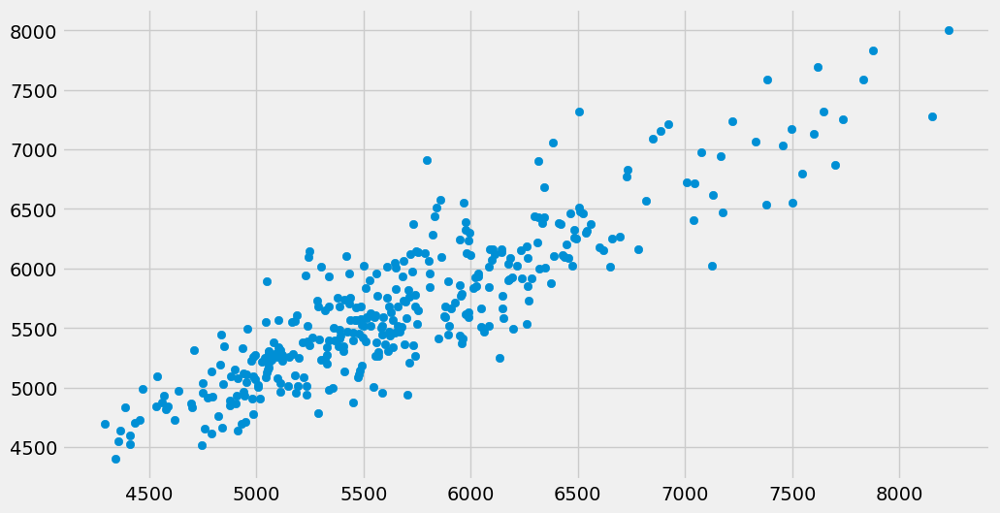

In [214]:
plt.scatter(y_test,lin_pred)

In [216]:
residual = y_test-lin_pred

C:\Users\anura\AppData\Local\Temp\ipykernel_14780\1108040850.py:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: ylabel='Density'>

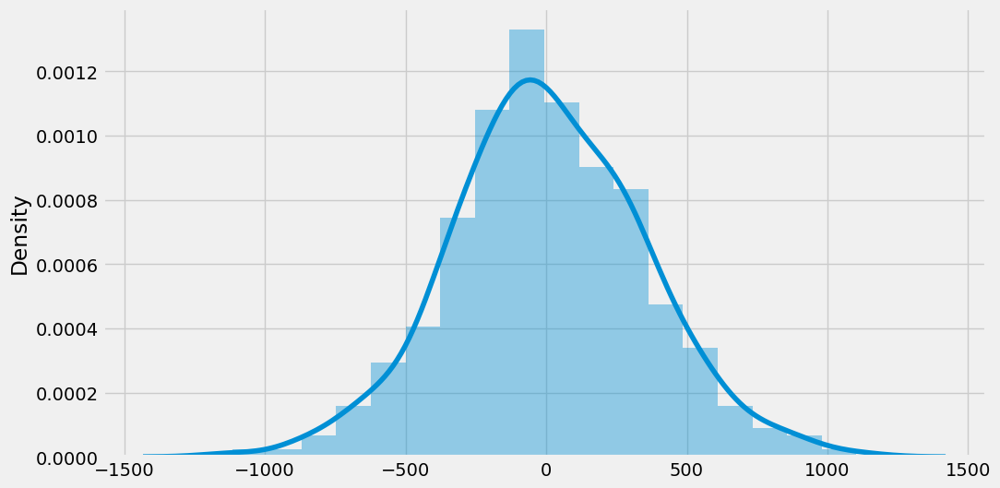

In [218]:
sns.distplot(residual)

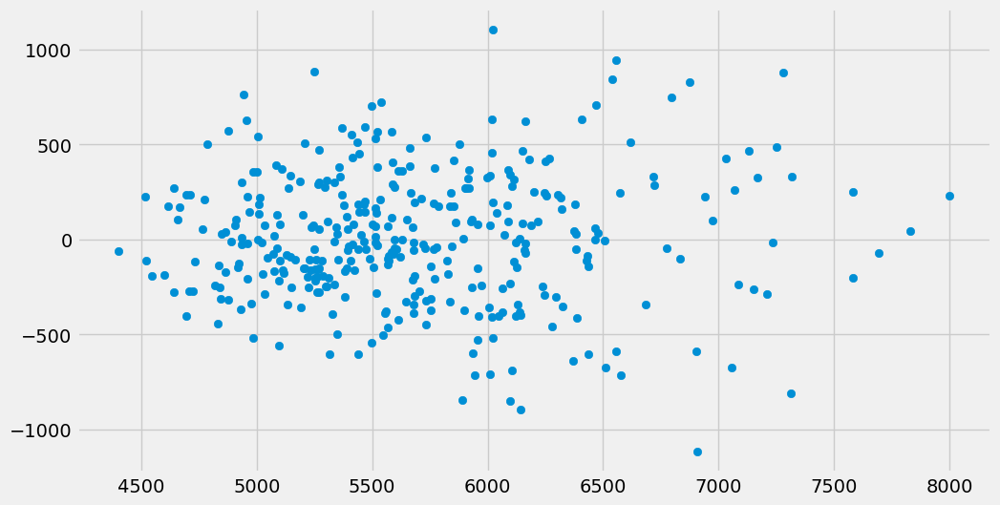

In [220]:
plt.scatter(lin_pred,residual)

In [222]:
from xgboost import XGBRegressor

In [224]:
xg_model = XGBRegressor()

In [226]:
xg_model.fit(X_train, y_train, verbose=False)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...)

In [228]:
predictions = xg_model.predict(X_test)

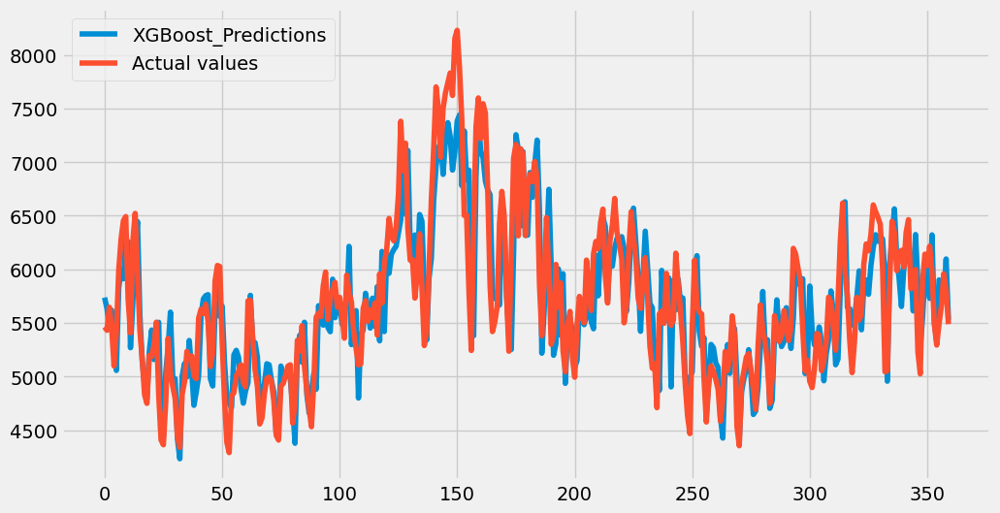

In [230]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (11,6)
plt.plot(predictions,label='XGBoost_Predictions')
plt.plot(y_test,label='Actual values')
plt.legend(loc="upper left")
plt.show()

# Calculate the RMSE,MAPE and MAE

In [233]:
from sklearn.metrics import mean_squared_error, mean_absolute_error , mean_absolute_percentage_error
from math import sqrt

RMSE_RF=sqrt(mean_squared_error(ran_pred,y_test))
RMSE_LR=sqrt(mean_squared_error(lin_pred,y_test))
MAE_RF = mean_absolute_error(ran_pred,y_test)
MAE_LR = mean_absolute_error(lin_pred,y_test)
MAPE_RF = round((mean_absolute_percentage_error(ran_pred,y_test)*100),3)
MAPE_LR = round((mean_absolute_percentage_error(lin_pred,y_test)*100),3)
MAE_XG = mean_absolute_error(y_test, predictions)
MAPE_XG= round((mean_absolute_percentage_error(y_test,predictions)*100),3)
RMSE_xg=sqrt(mean_squared_error(predictions,y_test))

In [235]:
print('RMSE for Random Forest Model is:',RMSE_RF)
print('MAE for Random Forest Model is:',MAE_RF)
print('MAPE for Random Forest Model is:',MAPE_RF)


RMSE for Random Forest Model is: 346.4975114729343
MAE for Random Forest Model is: 273.41029119512467
MAPE for Random Forest Model is: 4.741


In [237]:
print('RMSE for Linear Regression Model is:',RMSE_LR)
print('MAE for Linear Regression Model is:',MAE_LR)
print('MAPE for Linear Regression Model is:',MAPE_LR)

RMSE for Linear Regression Model is: 342.57458816388464
MAE for Linear Regression Model is: 269.31156194432833
MAPE for Linear Regression Model is: 4.703


In [239]:
print('RMSE for XG Boost Model is:',RMSE_xg)
print('MAE for XG Boos Model is:',MAE_XG)
print('MAPE for XG Boos Model is:',MAPE_XG)

RMSE for XG Boost Model is: 355.7936194259219
MAE for XG Boos Model is: 275.4103392507282
MAPE for XG Boos Model is: 4.764


## Calculate forecasting accuracy

### 1.LR Model

In [243]:
from sklearn.linear_model import LinearRegression
final_lin_model=LinearRegression()

final_lin_model.fit(final_x,y)

LinearRegression()

In [245]:
forecast_check_data = np.array(daily_data['Energy'][:'2018-07-04'][-7:])

In [247]:
z=forecast_check_data

for i in range(0,30):
    ck=z[-7:]
    ck=np.array([ck])
    lin_f_chk=final_lin_model.predict(ck)
    z=np.append(z,lin_f_chk)
    i=+1
future_pred_lr=z[-30:]

In [249]:
future_pred_lr

array([6038.98584385, 6251.31921074, 6090.94744975, 6184.34952891,
       6440.762583  , 6353.43246099, 6611.50906623, 5985.47412118,
       6325.81523525, 6019.29213323, 6096.18276059, 6366.31926032,
       6071.17074265, 6758.30650626, 5829.63617178, 6474.35693027,
       5934.62084065, 6022.23446211, 6422.42566433, 5669.62254581,
       7014.6910035 , 5494.66804104, 6732.59633194, 5813.98202879,
       5913.96885944, 6675.03234582, 5058.58125447, 7532.82648365,
       4861.90735002, 7174.48599727])

In [251]:
future_chk = pd.date_range('2018-07-05','2018-08-03', freq='D')
future_chk_df = pd.DataFrame(index=future_chk)

In [253]:
future_chk_df['future_chk_energy'] = future_pred_lr.tolist()

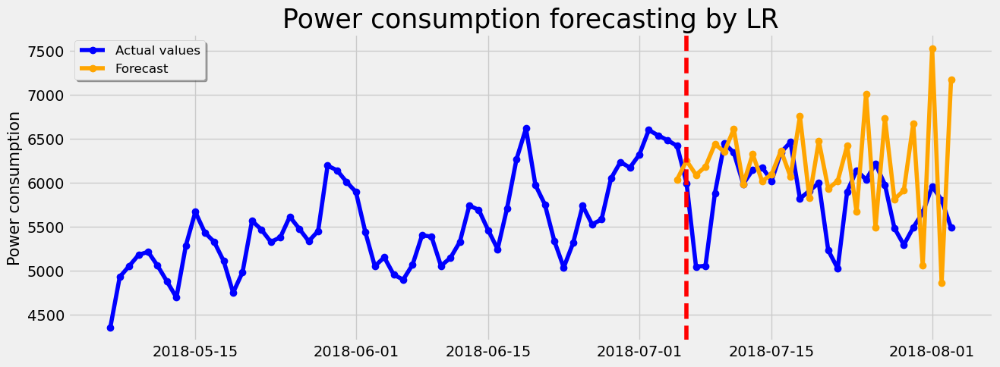

In [255]:
plt.figure(figsize=(14,5))
plt.title("Power consumption forecasting by LR", fontsize=25)

plt.plot(daily_data1[-90:].index,daily_data1[-90:].values, label='Actual values', color="blue", marker="o")

plt.plot(future_chk_df.index,future_chk_df.values, label='Forecast', color="orange", marker="o")
# plt.fill_between(future_df.index, lower_limits_f, upper_limits_f, alpha=0.1, color="orange")

plt.axvline(future_chk_df.index[1], color="red", linestyle="--")
plt.legend(fontsize=12, fancybox=True, shadow=True, frameon=True)
plt.ylabel('Power consumption', fontsize=15)
plt.show()

In [257]:
daily_data_last_30 = daily_data['Energy'].tail(30)

In [259]:
MAE_check = mean_absolute_error(daily_data_last_30, future_chk_df)
MAPE_check= round((mean_absolute_percentage_error(daily_data_last_30,future_chk_df)*100),3)
RMSE_check=sqrt(mean_squared_error(future_chk_df,daily_data_last_30))


In [261]:
print('RMSE for forecast check is:',RMSE_check)
print('MAE for forecast check is:',MAE_check)
print('MAPE for forecast check is:',MAPE_check)

RMSE for forecast check is: 748.1299433652387
MAE for forecast check is: 604.5203961263164
MAPE for forecast check is: 10.681


### 2.RF Model

In [264]:
from sklearn.ensemble import RandomForestRegressor
final_RF_model=RandomForestRegressor(n_estimators=100,max_features=3, random_state=1)

In [266]:
final_RF_model.fit(final_x,y)

C:\Users\anura\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:1389: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



RandomForestRegressor(max_features=3, random_state=1)

In [268]:
z=forecast_check_data

for i in range(0,30):
    ck=z[-7:]
    ck=np.array([ck])
    rf_f_chk=final_RF_model.predict(ck)
    z=np.append(z,rf_f_chk)
    i=+1
future_pred_RF=z[-30:]

In [270]:
future_pred_RF

array([6039.14869048, 6129.37687319, 5952.62841667, 6243.40462905,
       6621.55883088, 6353.12485973, 6569.96323164, 5973.65841667,
       6179.83067029, 5886.71931159, 6023.99222826, 6494.58305078,
       6182.3992598 , 6576.0400696 , 5949.24833333, 6254.19230702,
       5886.91      , 5859.81241667, 6516.46833405, 6018.1075    ,
       6657.11861216, 5898.87619048, 6279.96364035, 5967.88600877,
       5748.85      , 6580.88020491, 5908.29566667, 6741.81245133,
       5863.43958333, 6350.23825029])

In [272]:
future_chk_rf = pd.date_range('2018-07-05','2018-08-03', freq='D')
future_chk_df_rf = pd.DataFrame(index=future_chk_rf)
future_chk_df_rf['future_chk_energy'] = future_pred_RF.tolist()

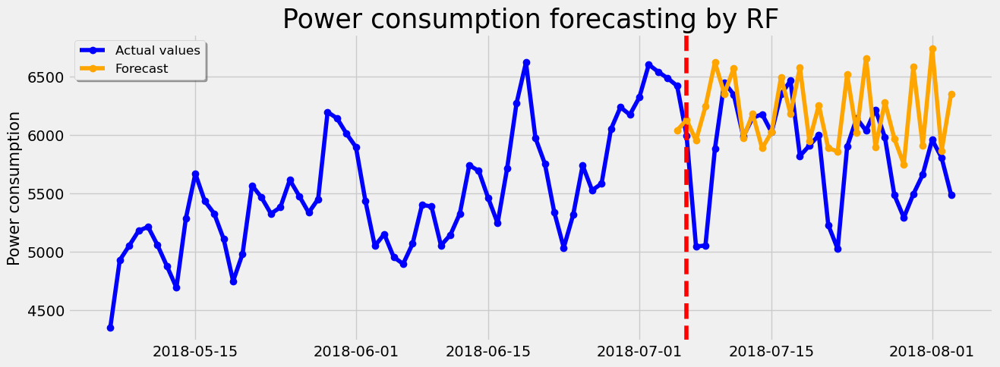

In [274]:
plt.figure(figsize=(14,5))
plt.title("Power consumption forecasting by RF", fontsize=25)

plt.plot(daily_data1[-90:].index,daily_data1[-90:].values, label='Actual values', color="blue", marker="o")

plt.plot(future_chk_df_rf.index,future_chk_df_rf.values, label='Forecast', color="orange", marker="o")
# plt.fill_between(future_df.index, lower_limits_f, upper_limits_f, alpha=0.1, color="orange")

plt.axvline(future_chk_df_rf.index[1], color="red", linestyle="--")
plt.legend(fontsize=12, fancybox=True, shadow=True, frameon=True)
plt.ylabel('Power consumption', fontsize=15)
plt.show()

In [276]:
MAE_rf_check = mean_absolute_error(daily_data_last_30, future_chk_df_rf)
MAPE_rf_check= round((mean_absolute_percentage_error(daily_data_last_30,future_chk_df_rf)*100),3)
RMSE_rf_check=sqrt(mean_squared_error(future_chk_df_rf,daily_data_last_30))
print('RMSE for RF forecast check is:',RMSE_rf_check)
print('MAE for RF forecast check is:',MAE_rf_check)
print('MAPE for RF forecast check is:',MAPE_rf_check)

RMSE for RF forecast check is: 546.8498682853016
MAE for RF forecast check is: 431.2064304612366
MAPE for RF forecast check is: 7.694


### 3.XGB Model

In [279]:
from xgboost import XGBRegressor
final_xg_model = XGBRegressor()
final_xg_model.fit(final_x,y, verbose=False)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...)

In [281]:
z=forecast_check_data

for i in range(0,30):
    ck=z[-7:]
    ck=np.array([ck])
    xgb_f_chk=final_xg_model.predict(ck)
    z=np.append(z,xgb_f_chk)
    i=+1
future_pred_XGB=z[-30:]

In [283]:
future_pred_XGB

array([6161.54345703, 6089.93554688, 6160.62792969, 6130.03320312,
       6615.23242188, 6341.37255859, 6588.76220703, 5996.67675781,
       5954.2890625 , 6012.61523438, 5885.82373047, 6693.97753906,
       6421.9453125 , 6695.40332031, 5964.19091797, 5601.74072266,
       5879.12109375, 5736.12158203, 6510.07958984, 6306.43505859,
       6568.61914062, 6133.95410156, 5744.59521484, 6404.05517578,
       5200.70214844, 6563.52685547, 5097.91699219, 6682.67724609,
       5570.55224609, 5021.62060547])

In [285]:
future_chk_xgb = pd.date_range('2018-07-05','2018-08-03', freq='D')
future_chk_df_xgb = pd.DataFrame(index=future_chk_xgb)
future_chk_df_xgb['future_chk_energy'] = future_pred_XGB.tolist()

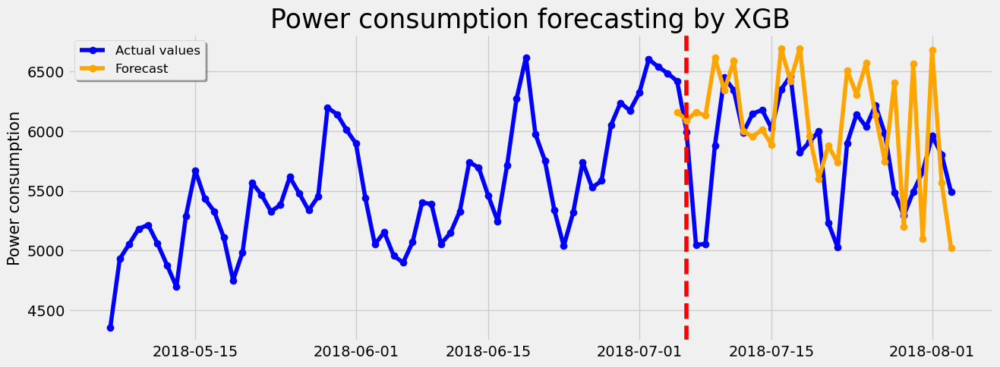

In [287]:
plt.figure(figsize=(14,5))
plt.title("Power consumption forecasting by XGB", fontsize=25)

plt.plot(daily_data1[-90:].index,daily_data1[-90:].values, label='Actual values', color="blue", marker="o")

plt.plot(future_chk_df_xgb.index,future_chk_df_xgb.values, label='Forecast', color="orange", marker="o")
# plt.fill_between(future_df.index, lower_limits_f, upper_limits_f, alpha=0.1, color="orange")

plt.axvline(future_chk_df_xgb.index[1], color="red", linestyle="--")
plt.legend(fontsize=12, fancybox=True, shadow=True, frameon=True)
plt.ylabel('Power consumption', fontsize=15)
plt.show()

In [289]:
MAE_xgb_check = mean_absolute_error(daily_data_last_30, future_chk_df_xgb)
MAPE_xgb_check= round((mean_absolute_percentage_error(daily_data_last_30,future_chk_df_xgb)*100),3)
RMSE_xgb_check=sqrt(mean_squared_error(future_chk_df_xgb,daily_data_last_30))
print('RMSE for XGB forecast check is:',RMSE_xgb_check)
print('MAE for XGB forecast check is:',MAE_xgb_check)
print('MAPE for XGB forecast check is:',MAPE_xgb_check)

RMSE for XGB forecast check is: 547.6257857147474
MAE for XGB forecast check is: 429.9345844184029
MAPE for XGB forecast check is: 7.669


## Forecast

In [292]:
from sklearn.ensemble import RandomForestRegressor
final_RF_model=RandomForestRegressor(n_estimators=100,max_features=3, random_state=1)

In [294]:
final_RF_model.fit(final_x,y)

C:\Users\anura\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:1389: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



RandomForestRegressor(max_features=3, random_state=1)

In [295]:
daily_data_last_7 = np.array(daily_data['Energy'].tail(7))
daily_data_last_7

array([5485.79166667, 5293.83333333, 5492.70833333, 5660.75      ,
       5959.70833333, 5805.04166667, 5489.        ])

In [298]:
np.savetxt("daily_data_last_7.csv", daily_data_last_7, delimiter=",")

In [300]:
z=daily_data_last_7

for i in range(0,30):
    r=z[-7:]
    r=np.array([r])
    ranf_f=final_RF_model.predict(r)
    z=np.append(z,ranf_f)
    i=+1
future_pred=z[-30:]

In [302]:
future_pred

array([5760.91041667, 5292.60541667, 5562.36713768, 5546.90541667,
       5900.88125   , 5771.27875   , 5593.31291667, 5863.63561594,
       5349.98375   , 5853.53416667, 5375.07297101, 5866.45625   ,
       5597.41541667, 5598.94208333, 5909.29291667, 5331.0692029 ,
       5944.6536715 , 5374.36628623, 5895.87541667, 5621.51125   ,
       5599.135     , 5967.64083333, 5297.67583333, 5912.72728261,
       5343.32628623, 5902.24411232, 5604.82791667, 5608.30958333,
       5973.23625   , 5290.475     ])

In [304]:
future = pd.date_range('2018-08-04','2018-09-02', freq='D')
future_df = pd.DataFrame(index=future)

In [306]:
future_df['future_energy'] = future_pred.tolist()

In [308]:
print(future_df)

            future_energy
2018-08-04    5760.910417
2018-08-05    5292.605417
2018-08-06    5562.367138
2018-08-07    5546.905417
2018-08-08    5900.881250
2018-08-09    5771.278750
2018-08-10    5593.312917
2018-08-11    5863.635616
2018-08-12    5349.983750
2018-08-13    5853.534167
2018-08-14    5375.072971
2018-08-15    5866.456250
2018-08-16    5597.415417
2018-08-17    5598.942083
2018-08-18    5909.292917
2018-08-19    5331.069203
2018-08-20    5944.653671
2018-08-21    5374.366286
2018-08-22    5895.875417
2018-08-23    5621.511250
2018-08-24    5599.135000
2018-08-25    5967.640833
2018-08-26    5297.675833
2018-08-27    5912.727283
2018-08-28    5343.326286
2018-08-29    5902.244112
2018-08-30    5604.827917
2018-08-31    5608.309583
2018-09-01    5973.236250
2018-09-02    5290.475000


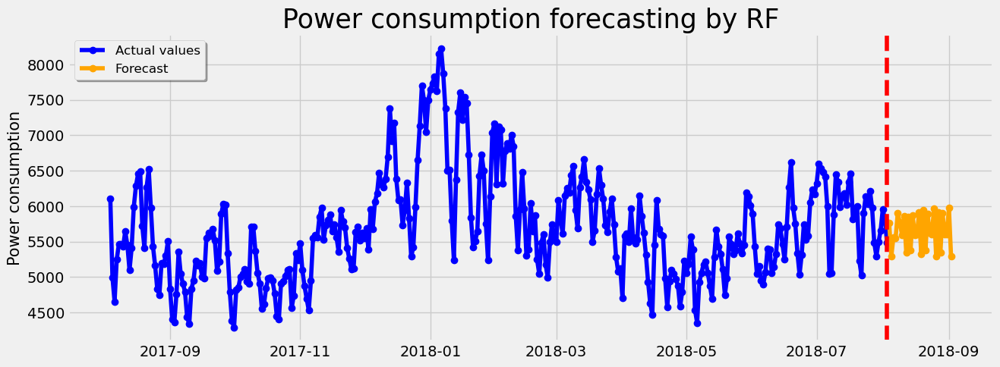

In [310]:
plt.figure(figsize=(14,5))
plt.title("Power consumption forecasting by RF", fontsize=25)

plt.plot(daily_data1[-365:].index,daily_data1[-365:].values, label='Actual values', color="blue", marker="o")

plt.plot(future_df.index,future_df.values, label='Forecast', color="orange", marker="o")
# plt.fill_between(future_df.index, lower_limits_f, upper_limits_f, alpha=0.1, color="orange")

plt.axvline(daily_data1.index[-1], color="red", linestyle="--")
plt.legend(fontsize=12, fancybox=True, shadow=True, frameon=True)
plt.ylabel('Power consumption', fontsize=15)
plt.show()

## Saving the model

In [313]:
# !pip install pickle-mixin

In [315]:
import pickle

In [317]:
filename = 'final_rf_model.pkl'
pickle.dump(final_RF_model, open(filename,'wb'))

In [319]:
pickled_model=pickle.load(open('final_rf_model.pkl','rb'))

In [321]:
pk=pickled_model.predict(X_test)